<div class="alert alert-block alert-info">
<h1> Analyse MTBLS290 peak table</h1>
<h3>Link to dataset in Metabolights <a href="https://www.ebi.ac.uk/metabolights/MTBLS290/">here</a>.</h3>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
  - [Below are all the peak tables each batch of the MLBLS19 dataset](#Below-are-all-the-peak-tables-each-batch-of-the-MLBLS19-dataset)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with half minimum value in features](#a---Impute-intensities-with-half-minimum-value-in-features)
  - [b - PCA](#b---PCA)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import os
import cimcb_lite as cb

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

python_version = ! python --version
print(f'Python version : {python_version[0]}')

Working directory : /home/jovyan/work/
Python version : Python 3.10.4


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

# 0 - Import data

## Below are all the peak tables each batch of the MLBLS19 dataset

In [5]:
peakTable_init = pd.read_excel(pwd + 'data/MTBLS290/MTBLS290.xlsx', sheet_name='Data')
print(f'Peak table shape : {peakTable_init.shape}')
peakTable_init.head()

Peak table shape : (95, 248)


,Idx,QC,SampleType,SampleID,Batch,Class,Organism,Organism part,Protocol REF,Sample Name,...,M227,M228,M229,M230,M231,M232,M233,M234,M235,M236
0,1,1,QC,QC9,1,QC,Homo sapiens,urine,Sample collection,QC9,...,1.840437e+06,1.157473e+06,2.337840e+06,2.337840e+06,1.192120e+07,5142625.314,3458768.755,35781.3210,215370.0398,215370.0398
1,2,1,QC,QC10,1,QC,Homo sapiens,urine,Sample collection,QC10,...,1.823570e+06,1.145890e+06,2.422276e+06,2.422276e+06,1.244483e+07,5538666.710,3880201.326,26458.1775,207555.0975,207555.0975
2,3,0,Sample,p1t2,1,Patient,Homo sapiens,urine,Sample collection,p1t2,...,5.221017e+05,2.799688e+05,7.173147e+05,7.173147e+05,9.543276e+05,3096407.411,2495386.327,33861.1880,158135.2760,158135.2760
3,4,0,Sample,p3t4,1,Patient,Homo sapiens,urine,Sample collection,p3t4,...,4.295461e+05,1.458601e+05,4.846860e+05,4.846860e+05,7.824380e+06,1198829.931,1644833.483,2517.1500,54213.8205,54213.8205
4,5,0,Sample,K1,1,Control,Homo sapiens,urine,Sample collection,K1,...,7.789649e+05,1.828575e+05,1.399567e+06,1.399567e+06,1.386025e+06,1238145.996,4866463.710,101284.7430,157686.6125,157686.6125


In [6]:
peakTable = peakTable_init.copy()

In [7]:
identification = pd.read_excel(pwd + 'data/MTBLS290/MTBLS290.xlsx', sheet_name='Peak')
print(f'Peak table shape : {identification.shape}')
identification.head()

Peak table shape : (236, 12)


,Idx,Name,Label,QC_RSD,Perc_missing,database_identifier,chemical_formula,smiles,inchi,metabolite_identification,taxid,species
0,1,M1,L-Valine,4.119400,0,CHEBI:16414,C5H11NO2,CC(C)[C@H](N)C(O)=O,"InChI=1S/C5H11NO2/c1-3(2)4(6)5(7)8/h3-4H,6H2,1...",L-Valine,NCBITAXON:http://purl.bioontology.org/ontology...,Homo sapiens
1,2,M2,L-Tyrosine,7.213483,0,CHEBI:17895,C9H11NO3,N[C@@H](Cc1ccc(O)cc1)C(O)=O,InChI=1S/C9H11NO3/c10-8(9(12)13)5-6-1-3-7(11)4...,L-Tyrosine,NCBITAXON:http://purl.bioontology.org/ontology...,Homo sapiens
2,3,M3,L-Tryptophan,7.825443,0,CHEBI:16828,C11H12N2O2,N[C@@H](Cc1c[nH]c2ccccc12)C(O)=O,InChI=1S/C11H12N2O2/c12-9(11(14)15)5-7-6-13-10...,L-Tryptophan,NCBITAXON:http://purl.bioontology.org/ontology...,Homo sapiens
3,4,M4,L-Threonine,9.196762,0,CHEBI:16857,C4H9NO3,C[C@@H](O)[C@H](N)C(O)=O,"InChI=1S/C4H9NO3/c1-2(6)3(5)4(7)8/h2-3,6H,5H2,...",L-Threonine,NCBITAXON:http://purl.bioontology.org/ontology...,Homo sapiens
4,5,M5,L-Homoserine,9.196762,0,CHEBI:15699,C4H9NO3,N[C@@H](CCO)C(O)=O,"InChI=1S/C4H9NO3/c5-3(1-2-6)4(7)8/h3,6H,1-2,5H...",L-Homoserine,NCBITAXON:http://purl.bioontology.org/ontology...,Homo sapiens


# 1 - Preprocess data

In [8]:
from explore_data_functions import *

## a - Separate dataframes 

In [9]:
X = peakTable.filter(regex=('^[M][0-9]+'))
X

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,M227,M228,M229,M230,M231,M232,M233,M234,M235,M236
0,8.424708e+06,4.040474e+06,2.737994e+06,5.600532e+06,5.600532e+06,5.293281e+06,3.107004e+07,858207.1148,800182.9995,5.957647e+06,...,1.840437e+06,1.157473e+06,2.337840e+06,2.337840e+06,1.192120e+07,5142625.314,3458768.755,35781.321000,215370.03980,215370.03980
1,8.549699e+06,4.014460e+06,2.625991e+06,5.115132e+06,5.115132e+06,5.584633e+06,2.988431e+07,877398.3380,834507.2915,5.942374e+06,...,1.823570e+06,1.145890e+06,2.422276e+06,2.422276e+06,1.244483e+07,5538666.710,3880201.326,26458.177500,207555.09750,207555.09750
2,4.629357e+06,2.626260e+06,2.663686e+06,2.743715e+06,2.743715e+06,2.953297e+06,1.632321e+07,862674.1120,708419.1145,2.675883e+06,...,5.221017e+05,2.799688e+05,7.173147e+05,7.173147e+05,9.543276e+05,3096407.411,2495386.327,33861.188000,158135.27600,158135.27600
3,2.011695e+06,7.348474e+05,6.992114e+05,9.412755e+05,9.412755e+05,2.200818e+06,5.581527e+06,113610.2050,161268.4905,3.298523e+06,...,4.295461e+05,1.458601e+05,4.846860e+05,4.846860e+05,7.824380e+06,1198829.931,1644833.483,2517.150000,54213.82050,54213.82050
4,6.524581e+06,1.548620e+06,2.492898e+06,2.923179e+06,2.923179e+06,3.546574e+06,1.010782e+07,62627.8490,452757.2952,6.828452e+05,...,7.789649e+05,1.828575e+05,1.399567e+06,1.399567e+06,1.386025e+06,1238145.996,4866463.710,101284.743000,157686.61250,157686.61250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,8.517687e+06,3.418264e+06,2.418852e+06,4.365211e+06,4.365211e+06,5.353033e+06,3.013922e+07,389607.8880,727946.2808,5.817263e+06,...,1.243153e+06,9.233404e+05,2.105752e+06,2.105752e+06,1.249861e+07,4537308.645,5065655.534,25116.459500,155394.65600,155394.65600
91,2.724794e+06,1.205375e+06,1.172044e+06,4.786256e+06,4.786256e+06,4.409136e+06,1.576986e+07,58527.0095,295618.1131,3.781715e+06,...,1.261530e+06,1.182810e+06,1.282581e+06,1.282581e+06,1.377885e+07,6596443.767,1831086.017,7958.785500,44950.32318,44950.32318
92,5.789542e+06,2.679931e+06,3.019433e+06,8.531440e+06,8.531440e+06,1.107270e+07,4.024305e+07,687231.2095,369766.4240,5.046373e+06,...,5.490089e+05,1.563210e+05,1.287826e+06,1.287826e+06,2.601829e+07,3423099.339,1340791.235,5321.822968,145036.69060,145036.69060
93,1.380929e+05,3.050297e+04,6.851811e+03,1.075518e+04,1.075518e+04,4.882751e+04,1.388751e+05,1096.7610,3144.2650,2.043413e+04,...,8.901942e+04,1.102709e+05,4.964008e+04,4.964008e+04,1.416756e+04,20368.501,20239.415,356.187500,1190.13100,1190.13100


In [10]:
all_metadata = peakTable.drop(X.columns, axis=1)
all_metadata

,Idx,QC,SampleType,SampleID,Batch,Class,Organism,Organism part,Protocol REF,Sample Name,Sample type,Sample collection type
0,1,1,QC,QC9,1,QC,Homo sapiens,urine,Sample collection,QC9,Quality control,NaN
1,2,1,QC,QC10,1,QC,Homo sapiens,urine,Sample collection,QC10,Quality control,NaN
2,3,0,Sample,p1t2,1,Patient,Homo sapiens,urine,Sample collection,p1t2,Patient 1,T2
3,4,0,Sample,p3t4,1,Patient,Homo sapiens,urine,Sample collection,p3t4,Patient 3,T4
4,5,0,Sample,K1,1,Control,Homo sapiens,urine,Sample collection,K1,Control K 1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
90,91,1,QC,QC25,1,QC,Homo sapiens,urine,Sample collection,QC25,Quality control,NaN
91,92,0,Sample,p4t6,1,Patient,Homo sapiens,urine,Sample collection,p4t6,Patient 4,T6
92,93,0,Sample,p5t5,1,Patient,Homo sapiens,urine,Sample collection,p5t5,Patient 5,T5
93,94,0,Blank,Blank4,1,Blank,blank,blank,Sample collection,Blank4,Blank4,NaN


In [11]:
metadata = all_metadata[['SampleID', 'Class']]
metadata

,SampleID,Class
0,QC9,QC
1,QC10,QC
2,p1t2,Patient
3,p3t4,Patient
4,K1,Control
...,...,...
90,QC25,QC
91,p4t6,Patient
92,p5t5,Patient
93,Blank4,Blank


### Set target feature

In [12]:
target = metadata['Class']
target

0          QC
1          QC
2     Patient
3     Patient
4     Control
       ...   
90         QC
91    Patient
92    Patient
93      Blank
94         QC
Name: Class, Length: 95, dtype: object

# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
float64    236
object       9
int64        3
dtype: int64



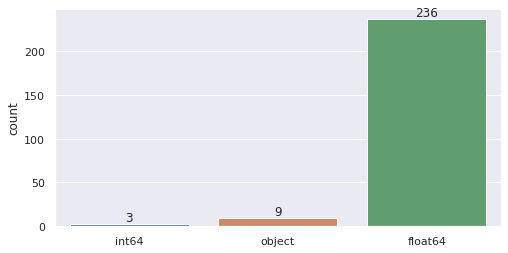

######################################################################################################################################################


In [13]:
plot_feature_types(peakTable)

## b - Missing values exploration

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 47
- Percent of missing values : 0.21%



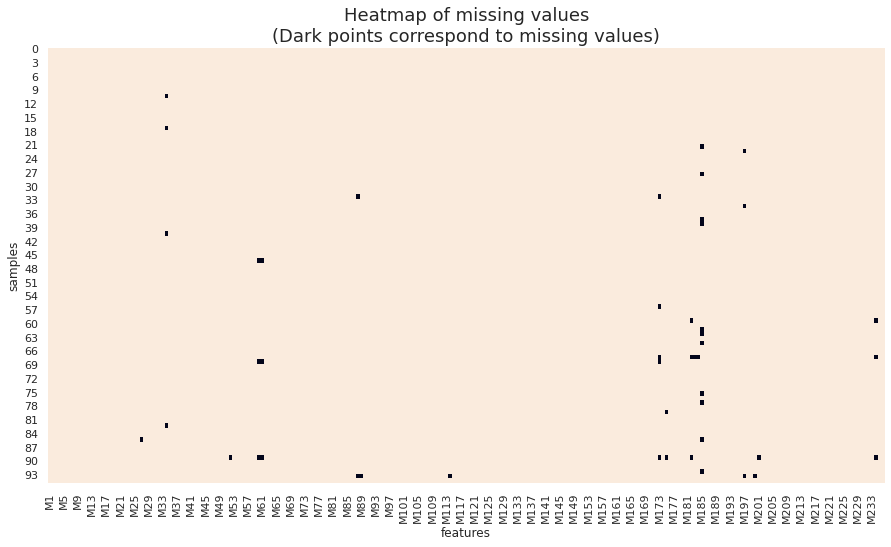

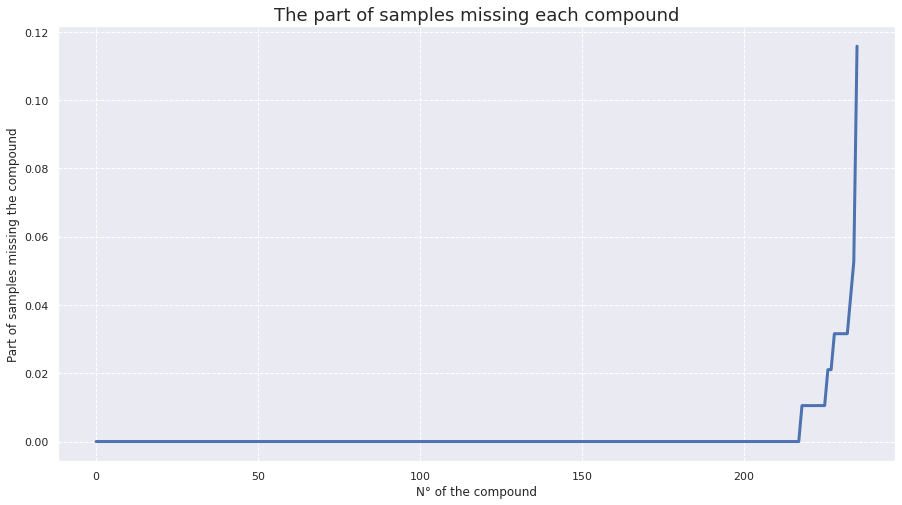



######################################################################################################################################################


In [14]:
plot_infos_missing_values(X)

In [15]:
plot_infos_missing_values(X, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

## c - Correlation between features

######################################################################################################################################################


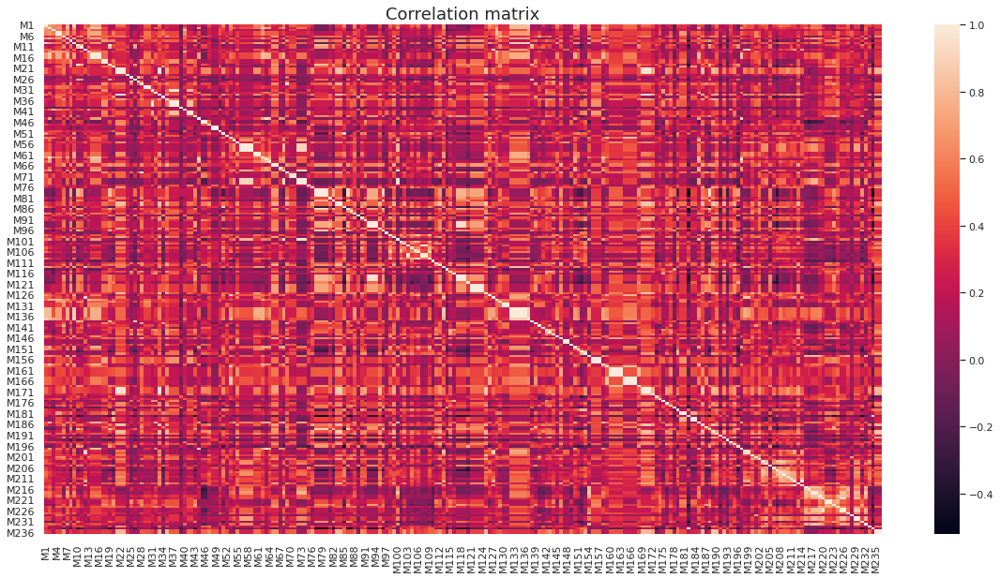

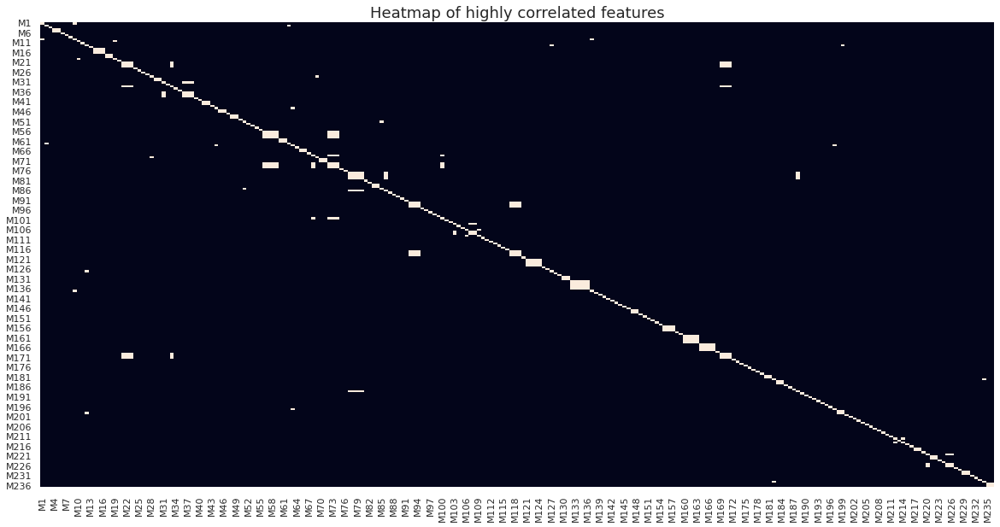



###################################################################################################################################################### 



In [16]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [17]:
X_remove_corr = remove_correlated_features(X)
X_remove_corr

Initial shape : (95, 236)
Final shape : (95, 169)

Time to compute : 00h00m00s

 ######################################################################################################################################################






,M1,M2,M3,M4,M6,M7,M8,M9,M10,M11,...,M221,M223,M224,M227,M228,M229,M231,M232,M233,M235
0,8.424708e+06,4.040474e+06,2.737994e+06,5.600532e+06,5.293281e+06,3.107004e+07,858207.1148,800182.9995,5.957647e+06,3.827843e+07,...,1.807053e+06,2.178840e+07,3476978.544,1.840437e+06,1.157473e+06,2.337840e+06,1.192120e+07,5142625.314,3458768.755,215370.03980
1,8.549699e+06,4.014460e+06,2.625991e+06,5.115132e+06,5.584633e+06,2.988431e+07,877398.3380,834507.2915,5.942374e+06,3.886757e+07,...,1.454422e+06,2.147658e+07,3468391.658,1.823570e+06,1.145890e+06,2.422276e+06,1.244483e+07,5538666.710,3880201.326,207555.09750
2,4.629357e+06,2.626260e+06,2.663686e+06,2.743715e+06,2.953297e+06,1.632321e+07,862674.1120,708419.1145,2.675883e+06,1.621837e+07,...,2.191956e+05,1.049085e+06,1591995.290,5.221017e+05,2.799688e+05,7.173147e+05,9.543276e+05,3096407.411,2495386.327,158135.27600
3,2.011695e+06,7.348474e+05,6.992114e+05,9.412755e+05,2.200818e+06,5.581527e+06,113610.2050,161268.4905,3.298523e+06,1.874513e+07,...,6.757305e+05,6.873796e+06,1201784.542,4.295461e+05,1.458601e+05,4.846860e+05,7.824380e+06,1198829.931,1644833.483,54213.82050
4,6.524581e+06,1.548620e+06,2.492898e+06,2.923179e+06,3.546574e+06,1.010782e+07,62627.8490,452757.2952,6.828452e+05,8.596548e+06,...,2.881483e+06,1.048462e+06,1268140.413,7.789649e+05,1.828575e+05,1.399567e+06,1.386025e+06,1238145.996,4866463.710,157686.61250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,8.517687e+06,3.418264e+06,2.418852e+06,4.365211e+06,5.353033e+06,3.013922e+07,389607.8880,727946.2808,5.817263e+06,3.383505e+07,...,2.070169e+06,1.877354e+07,3256736.636,1.243153e+06,9.233404e+05,2.105752e+06,1.249861e+07,4537308.645,5065655.534,155394.65600
91,2.724794e+06,1.205375e+06,1.172044e+06,4.786256e+06,4.409136e+06,1.576986e+07,58527.0095,295618.1131,3.781715e+06,2.348828e+07,...,2.205326e+06,2.306287e+07,2271649.634,1.261530e+06,1.182810e+06,1.282581e+06,1.377885e+07,6596443.767,1831086.017,44950.32318
92,5.789542e+06,2.679931e+06,3.019433e+06,8.531440e+06,1.107270e+07,4.024305e+07,687231.2095,369766.4240,5.046373e+06,7.551497e+07,...,1.328501e+06,5.761281e+07,2983959.734,5.490089e+05,1.563210e+05,1.287826e+06,2.601829e+07,3423099.339,1340791.235,145036.69060
93,1.380929e+05,3.050297e+04,6.851811e+03,1.075518e+04,4.882751e+04,1.388751e+05,1096.7610,3144.2650,2.043413e+04,1.657912e+05,...,2.131347e+04,1.100581e+05,67804.162,8.901942e+04,1.102709e+05,4.964008e+04,1.416756e+04,20368.501,20239.415,1190.13100


In [18]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,SampleID,Class,M1,M2,M3,M4,M6,M7,M8,M9,...,M221,M223,M224,M227,M228,M229,M231,M232,M233,M235
0,QC9,QC,8.424708e+06,4.040474e+06,2.737994e+06,5.600532e+06,5.293281e+06,3.107004e+07,858207.1148,800182.9995,...,1.807053e+06,2.178840e+07,3476978.544,1.840437e+06,1.157473e+06,2.337840e+06,1.192120e+07,5142625.314,3458768.755,215370.03980
1,QC10,QC,8.549699e+06,4.014460e+06,2.625991e+06,5.115132e+06,5.584633e+06,2.988431e+07,877398.3380,834507.2915,...,1.454422e+06,2.147658e+07,3468391.658,1.823570e+06,1.145890e+06,2.422276e+06,1.244483e+07,5538666.710,3880201.326,207555.09750
2,p1t2,Patient,4.629357e+06,2.626260e+06,2.663686e+06,2.743715e+06,2.953297e+06,1.632321e+07,862674.1120,708419.1145,...,2.191956e+05,1.049085e+06,1591995.290,5.221017e+05,2.799688e+05,7.173147e+05,9.543276e+05,3096407.411,2495386.327,158135.27600
3,p3t4,Patient,2.011695e+06,7.348474e+05,6.992114e+05,9.412755e+05,2.200818e+06,5.581527e+06,113610.2050,161268.4905,...,6.757305e+05,6.873796e+06,1201784.542,4.295461e+05,1.458601e+05,4.846860e+05,7.824380e+06,1198829.931,1644833.483,54213.82050
4,K1,Control,6.524581e+06,1.548620e+06,2.492898e+06,2.923179e+06,3.546574e+06,1.010782e+07,62627.8490,452757.2952,...,2.881483e+06,1.048462e+06,1268140.413,7.789649e+05,1.828575e+05,1.399567e+06,1.386025e+06,1238145.996,4866463.710,157686.61250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,QC25,QC,8.517687e+06,3.418264e+06,2.418852e+06,4.365211e+06,5.353033e+06,3.013922e+07,389607.8880,727946.2808,...,2.070169e+06,1.877354e+07,3256736.636,1.243153e+06,9.233404e+05,2.105752e+06,1.249861e+07,4537308.645,5065655.534,155394.65600
91,p4t6,Patient,2.724794e+06,1.205375e+06,1.172044e+06,4.786256e+06,4.409136e+06,1.576986e+07,58527.0095,295618.1131,...,2.205326e+06,2.306287e+07,2271649.634,1.261530e+06,1.182810e+06,1.282581e+06,1.377885e+07,6596443.767,1831086.017,44950.32318
92,p5t5,Patient,5.789542e+06,2.679931e+06,3.019433e+06,8.531440e+06,1.107270e+07,4.024305e+07,687231.2095,369766.4240,...,1.328501e+06,5.761281e+07,2983959.734,5.490089e+05,1.563210e+05,1.287826e+06,2.601829e+07,3423099.339,1340791.235,145036.69060
93,Blank4,Blank,1.380929e+05,3.050297e+04,6.851811e+03,1.075518e+04,4.882751e+04,1.388751e+05,1096.7610,3144.2650,...,2.131347e+04,1.100581e+05,67804.162,8.901942e+04,1.102709e+05,4.964008e+04,1.416756e+04,20368.501,20239.415,1190.13100


## e - PCA

In [19]:
if plot_infos_missing_values(X_remove_corr, plot=False) == 0:
    cb.plot.pca(X, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


In [20]:
if plot_infos_missing_values(X_remove_corr, plot=False) == 0:
    PCA_3D(X, peakTable, 'Disease')
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


### We will plot PCA after missing value imputation

## f - Target visualisation

In [21]:
#target = 

######################################################################################################################################################
Target values : 
Patient    50
Control    23
QC         18
Blank       4
Name: Class, dtype: int64



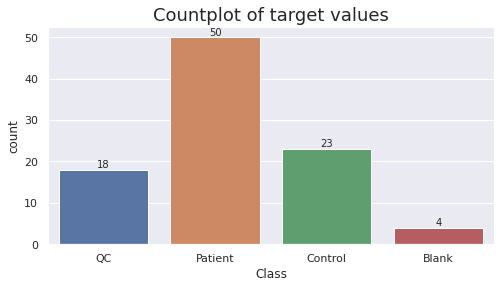

###################################################################################################################################################### 



In [22]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

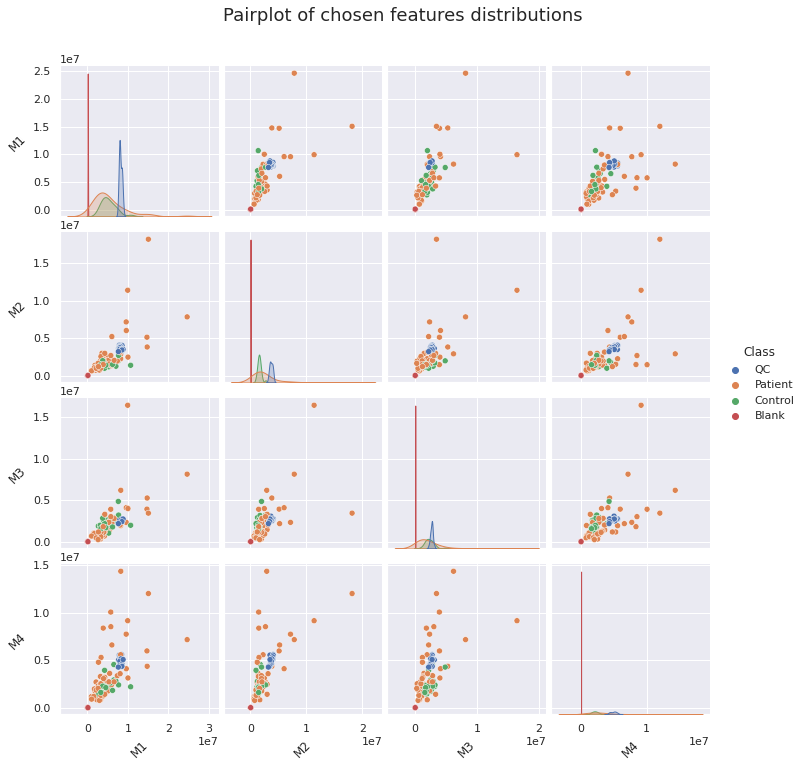

###################################################################################################################################################### 



In [23]:
plot_pairplot_distributions(X_remove_corr, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [24]:
n_features = 3

list_features = random.sample(X_remove_corr.columns.tolist(), n_features)
list_features

['M41', 'M147', 'M10']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

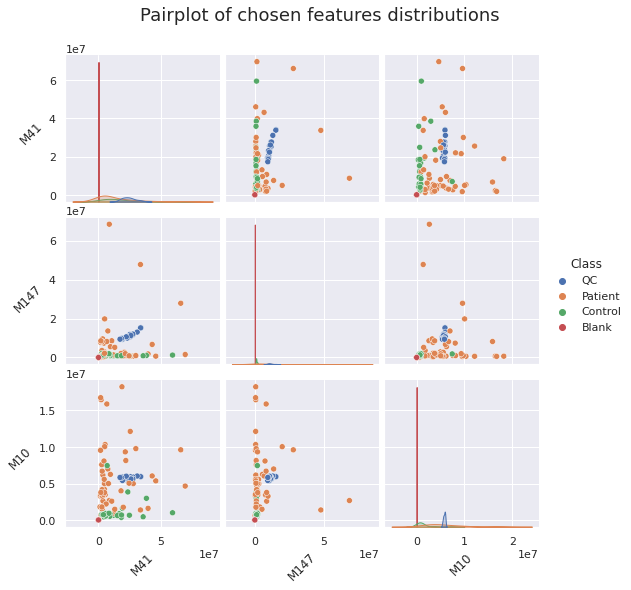

###################################################################################################################################################### 



In [25]:
plot_pairplot_distributions(X_remove_corr, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


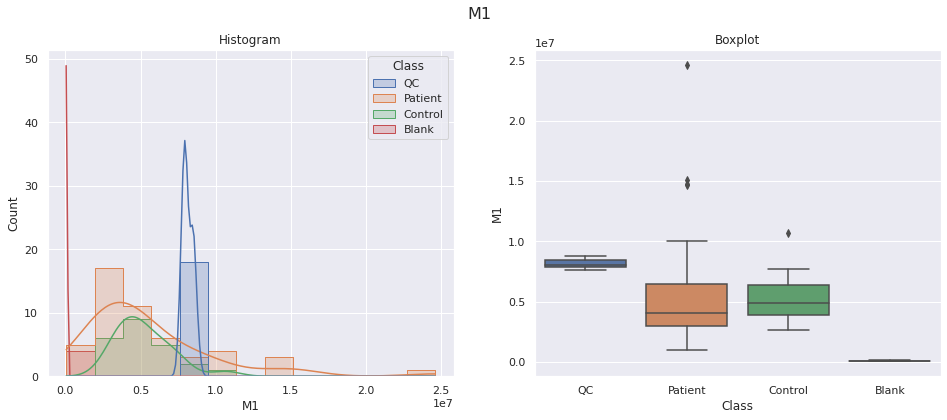

------------------------------------------------------------------------------------------------------------------------


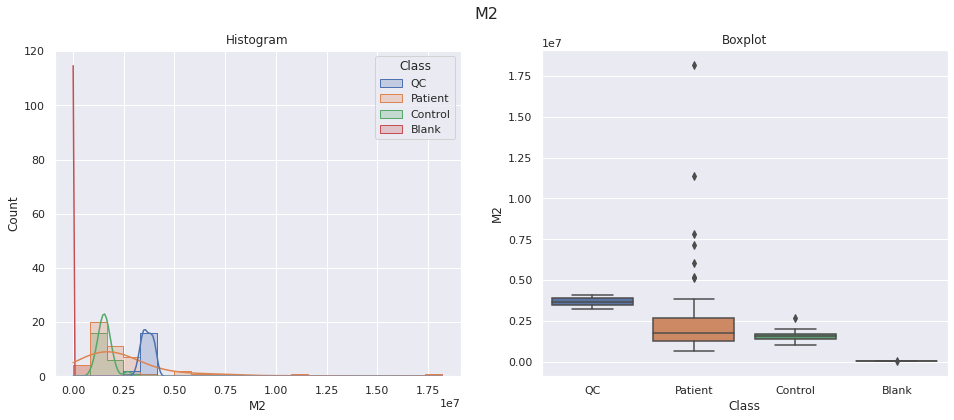

------------------------------------------------------------------------------------------------------------------------


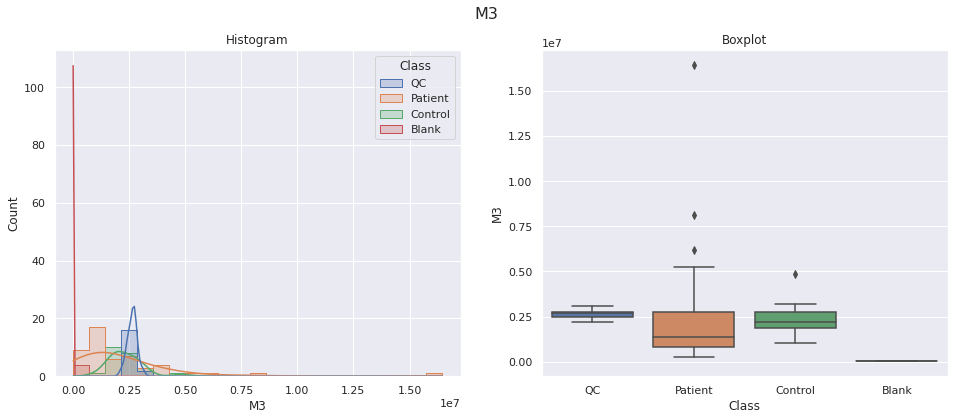

------------------------------------------------------------------------------------------------------------------------


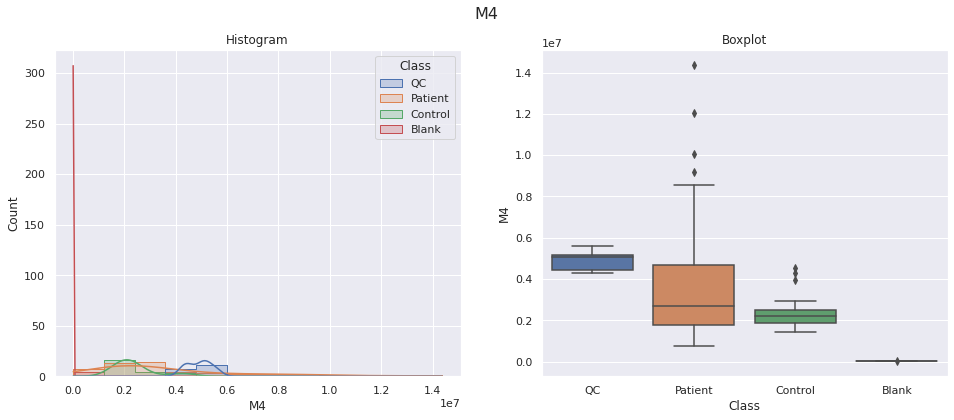

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [26]:
plot_hist_boxplot_distributions(X_remove_corr, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


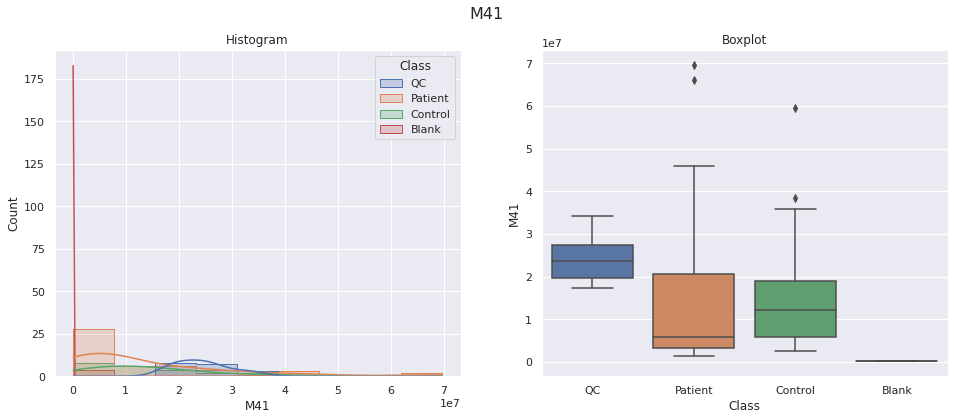

------------------------------------------------------------------------------------------------------------------------


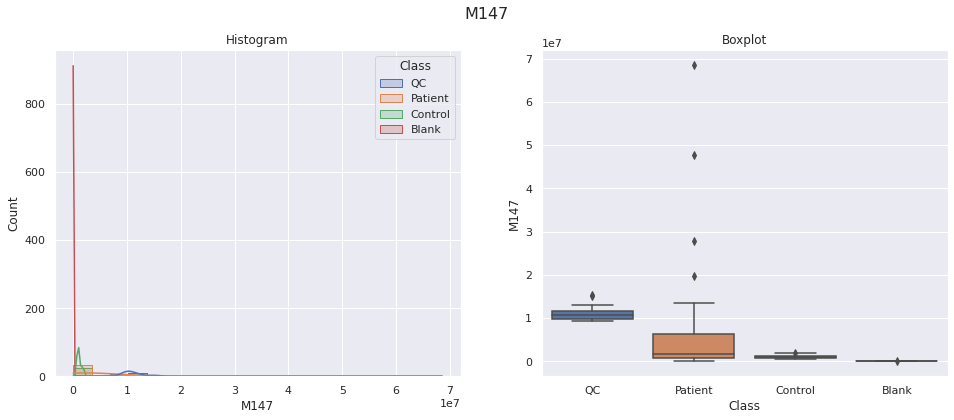

------------------------------------------------------------------------------------------------------------------------


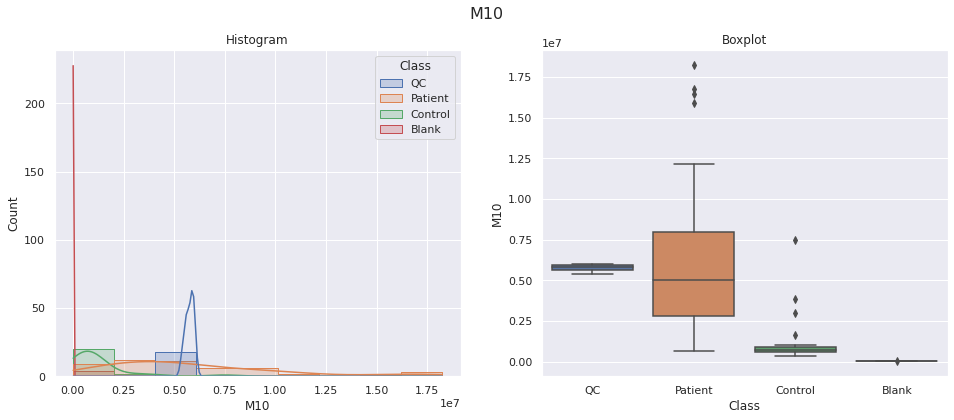

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [27]:
plot_hist_boxplot_distributions(X_remove_corr, target, list_features=list_features)

# 3 - Impute missing values

In [28]:
from missing_value_imputation_functions import *

### We observed before that missing values are here NaNs but there are also 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 37
- Percent of missing values : 0.23%



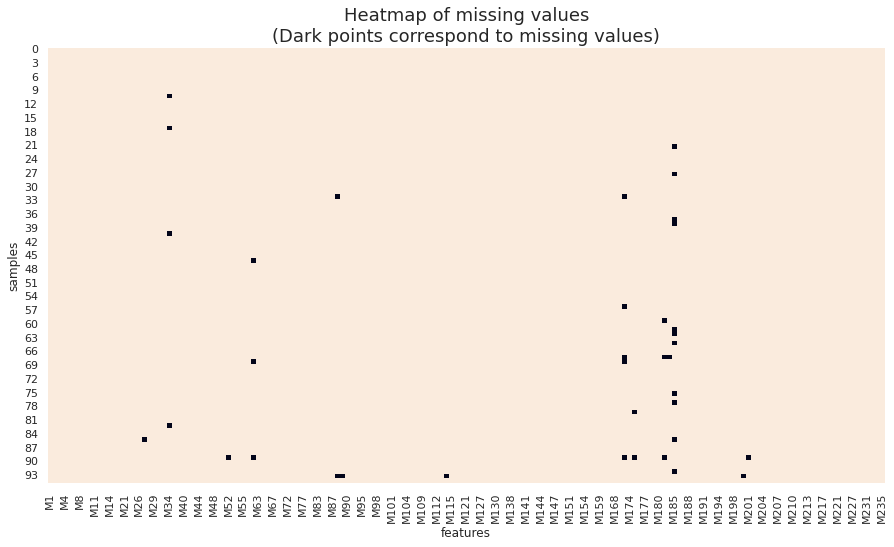

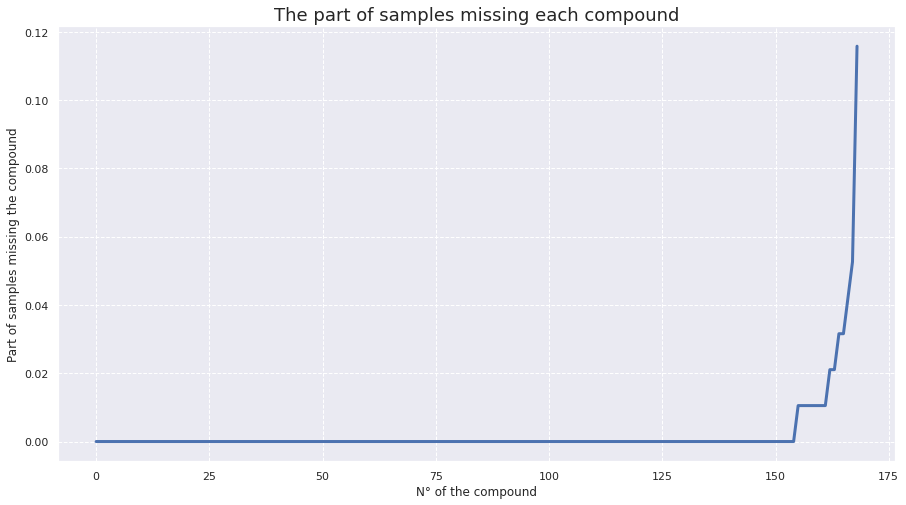



######################################################################################################################################################


In [29]:
plot_infos_missing_values(X_remove_corr, na_values=None) # same as simply plot_infos_missing_values(X)

### Here it's probably not the best idea to impute missing values with 1's, because some values in the peak table are inferior to 1

## a - Impute intensities with half minimum value in features

In [30]:
X_remove_corr_imp_halfmin = half_min_imputer(X_remove_corr)
X_remove_corr_imp_halfmin

,M1,M2,M3,M4,M6,M7,M8,M9,M10,M11,...,M221,M223,M224,M227,M228,M229,M231,M232,M233,M235
0,8.424708e+06,4.040474e+06,2.737994e+06,5.600532e+06,5.293281e+06,3.107004e+07,858207.1148,800182.9995,5.957647e+06,3.827843e+07,...,1.807053e+06,2.178840e+07,3476978.544,1.840437e+06,1.157473e+06,2.337840e+06,1.192120e+07,5142625.314,3458768.755,215370.03980
1,8.549699e+06,4.014460e+06,2.625991e+06,5.115132e+06,5.584633e+06,2.988431e+07,877398.3380,834507.2915,5.942374e+06,3.886757e+07,...,1.454422e+06,2.147658e+07,3468391.658,1.823570e+06,1.145890e+06,2.422276e+06,1.244483e+07,5538666.710,3880201.326,207555.09750
2,4.629357e+06,2.626260e+06,2.663686e+06,2.743715e+06,2.953297e+06,1.632321e+07,862674.1120,708419.1145,2.675883e+06,1.621837e+07,...,2.191956e+05,1.049085e+06,1591995.290,5.221017e+05,2.799688e+05,7.173147e+05,9.543276e+05,3096407.411,2495386.327,158135.27600
3,2.011695e+06,7.348474e+05,6.992114e+05,9.412755e+05,2.200818e+06,5.581527e+06,113610.2050,161268.4905,3.298523e+06,1.874513e+07,...,6.757305e+05,6.873796e+06,1201784.542,4.295461e+05,1.458601e+05,4.846860e+05,7.824380e+06,1198829.931,1644833.483,54213.82050
4,6.524581e+06,1.548620e+06,2.492898e+06,2.923179e+06,3.546574e+06,1.010782e+07,62627.8490,452757.2952,6.828452e+05,8.596548e+06,...,2.881483e+06,1.048462e+06,1268140.413,7.789649e+05,1.828575e+05,1.399567e+06,1.386025e+06,1238145.996,4866463.710,157686.61250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,8.517687e+06,3.418264e+06,2.418852e+06,4.365211e+06,5.353033e+06,3.013922e+07,389607.8880,727946.2808,5.817263e+06,3.383505e+07,...,2.070169e+06,1.877354e+07,3256736.636,1.243153e+06,9.233404e+05,2.105752e+06,1.249861e+07,4537308.645,5065655.534,155394.65600
91,2.724794e+06,1.205375e+06,1.172044e+06,4.786256e+06,4.409136e+06,1.576986e+07,58527.0095,295618.1131,3.781715e+06,2.348828e+07,...,2.205326e+06,2.306287e+07,2271649.634,1.261530e+06,1.182810e+06,1.282581e+06,1.377885e+07,6596443.767,1831086.017,44950.32318
92,5.789542e+06,2.679931e+06,3.019433e+06,8.531440e+06,1.107270e+07,4.024305e+07,687231.2095,369766.4240,5.046373e+06,7.551497e+07,...,1.328501e+06,5.761281e+07,2983959.734,5.490089e+05,1.563210e+05,1.287826e+06,2.601829e+07,3423099.339,1340791.235,145036.69060
93,1.380929e+05,3.050297e+04,6.851811e+03,1.075518e+04,4.882751e+04,1.388751e+05,1096.7610,3144.2650,2.043413e+04,1.657912e+05,...,2.131347e+04,1.100581e+05,67804.162,8.901942e+04,1.102709e+05,4.964008e+04,1.416756e+04,20368.501,20239.415,1190.13100


### We can check that there is no more missing values in the imputed peak tables

In [31]:
plot_infos_missing_values(X_remove_corr_imp_halfmin)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

## b - PCA

In [32]:
if plot_infos_missing_values(X_remove_corr_imp_halfmin, plot=False) == 0:
    cb.plot.pca(X_remove_corr_imp_halfmin, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

Loading BokehJS ...

In [33]:
if plot_infos_missing_values(X_remove_corr_imp_halfmin, plot=False) == 0:
    PCA_3D(X_remove_corr_imp_halfmin, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

# 4 - Transformations (here we will not transform dataset)

In [34]:
from normalisation_scaling_functions import *

## a - log transformation

In [35]:
#X_remove_corr_imp_halfmin_log = normPeakTable(X_remove_corr_imp_halfmin, 'log10', based='metabolite')
#X_remove_corr_imp_halfmin_log

## b - Standard scale intensities

In [36]:
X_remove_corr_imp_halfmin_std = normPeakTable(X_remove_corr_imp_halfmin, 'autoscaling', based='metabolites')
X_remove_corr_imp_halfmin_std

,M1,M2,M3,M4,M6,M7,M8,M9,M10,M11,...,M221,M223,M224,M227,M228,M229,M231,M232,M233,M235
0,0.739589,0.653188,0.246098,0.841334,0.518419,0.433367,0.961679,0.555505,0.376560,0.477129,...,0.182798,0.064899,0.545116,0.836413,0.115782,0.595585,0.198699,0.227365,0.320510,1.740835
1,0.773972,0.642103,0.189169,0.647453,0.645902,0.378609,1.008121,0.633957,0.372598,0.502950,...,-0.114036,0.052467,0.539643,0.816059,0.111678,0.667372,0.249375,0.308107,0.563582,1.599610
2,-0.304477,0.050572,0.208329,-0.299748,-0.505461,-0.247650,0.972489,0.345767,-0.474720,-0.489724,...,-1.153811,-0.761980,-0.656319,-0.754438,-0.195177,-0.782190,-0.862673,-0.189799,-0.235147,0.706532
3,-1.024571,-0.755385,-0.790171,-1.019685,-0.834714,-0.743707,-0.840195,-0.904813,-0.313209,-0.378980,...,-0.769514,-0.529748,-0.905029,-0.866126,-0.242701,-0.979972,-0.197790,-0.576660,-0.725726,-1.171457
4,0.216881,-0.408625,0.121521,-0.228065,-0.245867,-0.534680,-0.963568,-0.238579,-0.991707,-0.823774,...,1.087219,-0.762005,-0.862735,-0.444478,-0.229590,-0.202138,-0.820893,-0.568645,1.132435,0.698424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.765166,0.388056,0.083885,0.347917,0.544564,0.390381,-0.172299,0.390399,0.340145,0.282384,...,0.404281,-0.055304,0.404740,0.115663,0.032813,0.398263,0.254580,0.103959,1.247325,0.657006
91,-0.828404,-0.554887,-0.549840,0.516092,0.131554,-0.273204,-0.973492,-0.597740,-0.187870,-0.171096,...,0.518052,0.115712,-0.223127,0.137839,0.124761,-0.301599,0.378481,0.523757,-0.618300,-1.338860
92,0.014679,0.073442,0.389147,2.012008,3.047251,0.856982,0.547929,-0.428265,0.140178,2.109140,...,-0.220033,1.493222,0.230879,-0.721969,-0.238994,-0.297140,1.563012,-0.123196,-0.901091,0.469824
93,-1.539981,-1.055516,-1.142082,-1.391357,-1.776335,-0.995052,-1.112469,-1.266225,-1.163535,-1.193279,...,-1.320382,-0.799419,-1.627795,-1.277044,-0.255313,-1.349849,-0.953661,-0.816914,-1.662754,-2.129661


# 5 - Dimensionality reduction

In [37]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### $\rightarrow$ PCA is affected by scale so it's better to standardise the values in the peak table before applying PCA

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

#################################################################################################### 



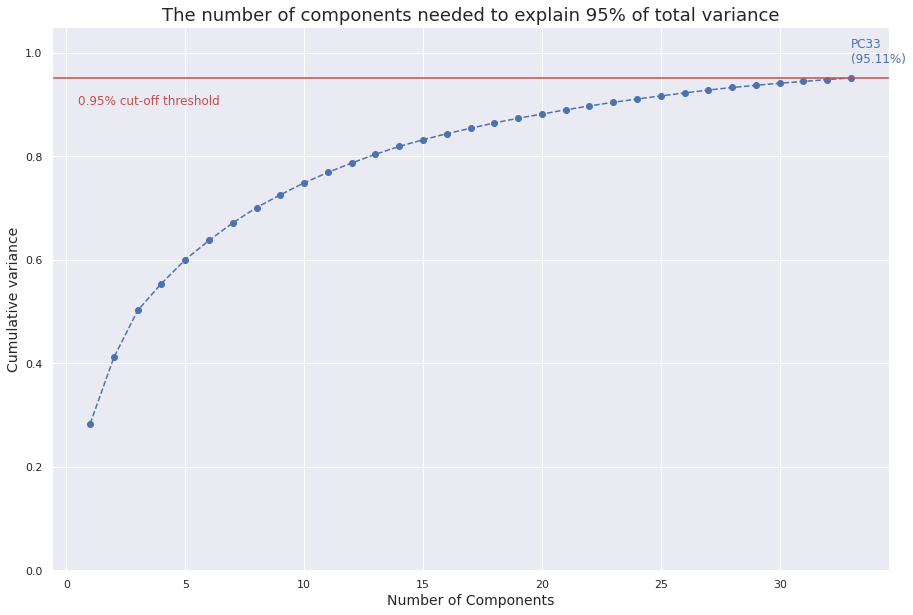

Initial number of dimension : 169
Final number of dimension : 33


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33
0,-11.879534,0.233585,-4.049573,-0.031361,0.206937,-0.164103,0.445399,0.885637,0.807384,0.266861,...,-0.422347,0.304634,0.425693,-0.300615,-0.337364,0.157074,-0.065905,-0.154222,-1.020796,0.434424
1,-12.013766,0.143718,-3.865133,0.019320,-0.263903,-0.400927,0.229181,1.034884,0.370819,0.465476,...,0.267754,0.270208,0.364035,-0.207614,-0.427140,-0.125755,-0.160962,-0.332358,-0.680031,0.044389
2,-2.059845,4.587578,-3.017857,0.956774,2.336163,3.991141,-1.034802,3.886127,1.237822,-2.998785,...,1.196589,-1.923371,-0.223616,-1.671926,2.875240,-1.138445,-1.408445,-0.424787,0.999164,-0.391033
3,9.614985,-0.913159,1.768111,0.212470,0.182450,1.499328,0.114770,0.766984,0.615743,-0.228766,...,-0.561230,0.419564,-0.019918,0.691958,-0.337430,-0.403911,0.167015,-0.245966,0.202261,-0.407777
4,0.404488,2.181370,-5.672327,-0.740803,1.079335,-2.255099,-0.485554,-1.098341,-0.669424,2.986727,...,-2.257849,-0.263627,-0.941012,-0.868357,0.383346,0.298815,1.493667,0.231299,0.872049,0.857603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,-4.063429,1.514441,-1.493367,-0.033906,0.130128,-0.140954,0.397159,-0.956485,-0.414188,-0.704196,...,1.034336,-0.765920,-0.618724,0.081130,0.170695,0.099319,-0.000694,0.020438,0.794161,-0.683907
91,7.596549,-1.319479,4.502977,-0.331625,-0.802706,-1.588314,-0.811727,0.752313,-1.690480,1.201246,...,0.198294,-0.983594,-0.670192,0.209152,1.002446,0.442607,-0.489572,0.418120,-0.482689,0.242105
92,-2.382186,-4.915493,2.538650,-2.486373,4.217488,3.606874,6.639291,0.416593,1.548999,-0.613618,...,1.257133,0.550849,-0.229394,-0.118183,1.441563,-0.139001,1.335495,1.096230,-1.636457,-0.781929
93,16.377942,0.910384,2.561481,0.753385,0.817104,1.224056,-0.689623,1.427221,0.433088,-0.123303,...,-0.069218,-0.504818,-0.118853,0.102070,-0.639477,-0.375048,-0.895040,-0.067909,-0.236595,-0.464742



 #################################################################################################### 

Time to compute t-SNE (input dataframe of shape (95, 33)) : 0.24 seconds

----------------------------------------------------------------------------------------------------


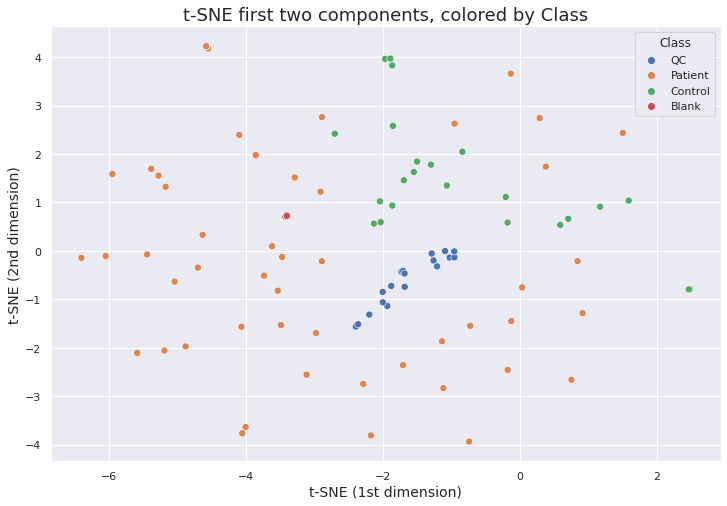

----------------------------------------------------------------------------------------------------


,tSNE1,tSNE2
0,-2.391955,-1.562838
1,-2.359457,-1.514072
2,-2.173249,-3.809487
3,-3.614876,0.096248
4,-1.850502,2.580731
...,...,...
90,-1.089843,-0.003583
91,-2.908226,1.223272
92,-5.585010,-2.107188
93,-3.398205,0.723828


In [38]:
# target = 

print(100 * '#', '\n')

matrix = X_remove_corr_imp_halfmin_std.copy()

X_remove_corr_imp_halfmin_std_PCA, explained_variance = perform_PCA(matrix, part_explained_variance=0.95)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_remove_corr_imp_halfmin_std_PCA)

print('\n', 100 * '#', '\n')

n_components = 2
X_remove_corr_imp_halfmin_std_PCA_tSNE = perform_tSNE(X_remove_corr_imp_halfmin_std_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
display(X_remove_corr_imp_halfmin_std_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

### $\rightarrow$ no need to standardise the values in the peak table before using this method but we will still use the standardised peak table for consistency

In [39]:
#target = 
matrix = X_remove_corr_imp_halfmin_std.copy()

X_remove_corr_imp_halfmin_std_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_halfmin_std_fs_anova)

Initial number of dimension : 169
Final number of dimension : 133


,features,f_scores,p_values
63,M95,37.851,0.0000
15,M21,37.638,0.0000
107,M153,35.927,0.0000
85,M125,30.243,0.0000
124,M182,30.146,0.0000
...,...,...,...
154,M215,4.517,0.0053
28,M41,4.332,0.0067
144,M204,4.135,0.0085
87,M127,4.072,0.0092


,M95,M21,M153,M125,M182,M99,M83,M213,M152,M190,...,M24,M139,M232,M220,M48,M215,M41,M204,M127,M13
0,2.004503,1.581296,1.564961,1.904516,0.819979,1.491938,2.518908,1.759418,1.030164,3.116285,...,0.666608,0.772042,0.227365,0.273675,0.760888,0.326787,1.268542,0.125504,0.379371,0.410211
1,1.645691,1.643837,1.818258,2.324537,0.306950,1.569089,2.481822,1.654368,1.086765,2.071016,...,0.673682,0.314612,0.308107,0.447489,0.529827,0.394705,1.252938,0.498396,0.586054,0.441597
2,0.322213,0.380274,0.642465,1.815153,0.714319,0.422168,0.382771,-0.292975,0.453720,0.930926,...,-1.117101,-0.383590,-0.189799,-0.342337,-0.675513,-0.699685,-0.483089,-0.524370,-0.125691,-0.216393
3,-1.183056,-1.582037,-1.332778,-1.268856,-1.010466,-1.312465,-1.274583,-1.591522,-0.922875,-1.084661,...,-0.985208,-0.466088,-0.576660,-0.680450,-0.749852,-0.771733,-0.980581,-0.660208,-0.858331,-0.816375
4,0.643112,0.033299,1.175855,-0.612525,4.424471,-0.327678,0.429007,-0.479827,0.153142,-0.030217,...,-0.420384,-0.048075,-0.568645,-0.691916,0.227741,-0.428960,-0.203108,-0.084460,-0.172410,-0.365818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,0.601245,1.043237,0.581527,-0.076933,0.233118,0.718125,0.140735,1.431078,1.008689,0.534479,...,0.513831,-0.137692,0.103959,-0.014886,0.279666,0.408004,0.191813,0.773264,0.326672,0.133950
91,-1.074731,-1.176135,-1.240142,-1.353000,-0.711026,-1.496092,-1.382398,-0.926318,-1.021262,-1.023792,...,-0.443114,-0.162809,0.523757,-0.324083,-0.715633,2.191144,-0.949566,-0.640300,-0.743719,-0.129696
92,-0.722515,-0.026711,-0.471382,0.334288,-0.856132,1.152855,-0.381619,0.232819,0.157716,1.117148,...,0.604586,0.529707,-0.123196,-0.205303,1.468529,-0.228895,0.613955,0.037441,-0.487634,2.972458
93,-1.947382,-2.113624,-1.692370,-1.929239,-1.129379,-1.883831,-2.177945,-1.949664,-1.049149,-1.934207,...,-1.416008,-0.915123,-0.816914,-0.715037,-0.841559,-0.896509,-1.079720,-1.192879,-1.108720,-1.041292


## c - Feature selection keeping a specific number of features

### $\rightarrow$ no need to standardise the values in the peak table before using this method

### Keeping 10 features

In [40]:
#target = 
matrix = X_remove_corr_imp_halfmin_std.copy()

X_remove_corr_imp_halfmin_std_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_halfmin_std_fs_nb_10)

Initial number of dimension : 169
Final number of dimension : 10


,features,f_scores,p_values
63,M95,37.851,0.0
15,M21,37.638,0.0
107,M153,35.927,0.0
85,M125,30.243,0.0
124,M182,30.146,0.0
67,M99,29.795,0.0
54,M83,29.765,0.0
153,M213,28.252,0.0
106,M152,27.437,0.0
131,M190,25.616,0.0


,M95,M21,M153,M125,M182,M99,M83,M213,M152,M190
0,2.004503,1.581296,1.564961,1.904516,0.819979,1.491938,2.518908,1.759418,1.030164,3.116285
1,1.645691,1.643837,1.818258,2.324537,0.306950,1.569089,2.481822,1.654368,1.086765,2.071016
2,0.322213,0.380274,0.642465,1.815153,0.714319,0.422168,0.382771,-0.292975,0.453720,0.930926
3,-1.183056,-1.582037,-1.332778,-1.268856,-1.010466,-1.312465,-1.274583,-1.591522,-0.922875,-1.084661
4,0.643112,0.033299,1.175855,-0.612525,4.424471,-0.327678,0.429007,-0.479827,0.153142,-0.030217
...,...,...,...,...,...,...,...,...,...,...
90,0.601245,1.043237,0.581527,-0.076933,0.233118,0.718125,0.140735,1.431078,1.008689,0.534479
91,-1.074731,-1.176135,-1.240142,-1.353000,-0.711026,-1.496092,-1.382398,-0.926318,-1.021262,-1.023792
92,-0.722515,-0.026711,-0.471382,0.334288,-0.856132,1.152855,-0.381619,0.232819,0.157716,1.117148
93,-1.947382,-2.113624,-1.692370,-1.929239,-1.129379,-1.883831,-2.177945,-1.949664,-1.049149,-1.934207


######################################################################################################################################################


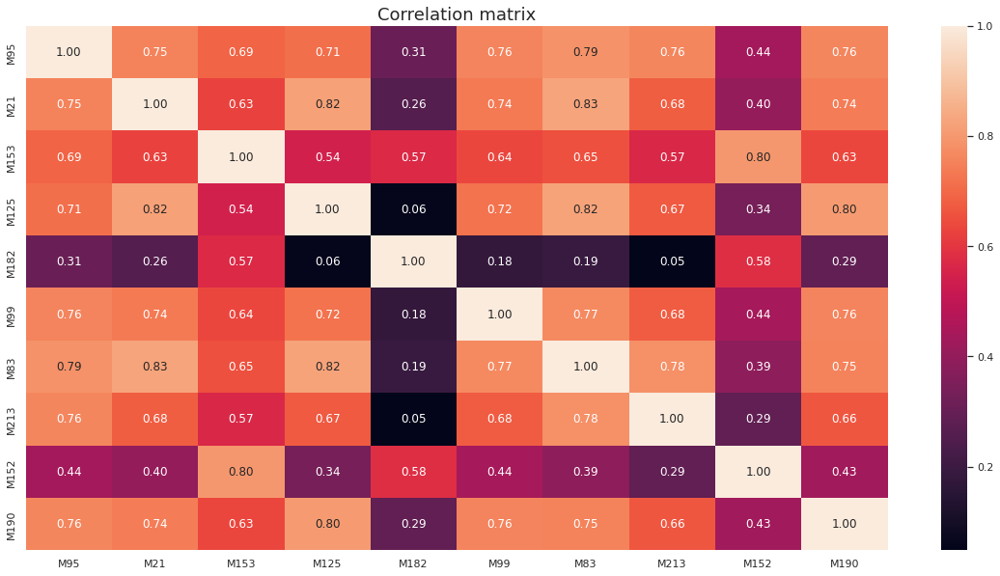

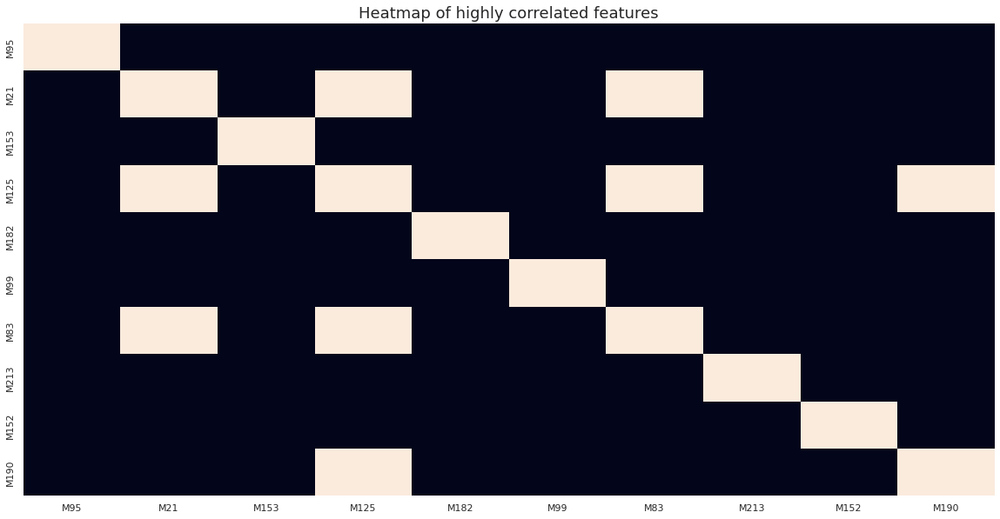



###################################################################################################################################################### 



In [41]:
matrix = pd.concat([target, X_remove_corr_imp_halfmin_std_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 5 features

In [42]:
#target = 
matrix = X_remove_corr_imp_halfmin_std.copy()

X_remove_corr_imp_halfmin_std_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_halfmin_std_fs_nb_5)

Initial number of dimension : 169
Final number of dimension : 5


,features,f_scores,p_values
63,M95,37.851,0.0
15,M21,37.638,0.0
107,M153,35.927,0.0
85,M125,30.243,0.0
124,M182,30.146,0.0


,M95,M21,M153,M125,M182
0,2.004503,1.581296,1.564961,1.904516,0.819979
1,1.645691,1.643837,1.818258,2.324537,0.306950
2,0.322213,0.380274,0.642465,1.815153,0.714319
3,-1.183056,-1.582037,-1.332778,-1.268856,-1.010466
4,0.643112,0.033299,1.175855,-0.612525,4.424471
...,...,...,...,...,...
90,0.601245,1.043237,0.581527,-0.076933,0.233118
91,-1.074731,-1.176135,-1.240142,-1.353000,-0.711026
92,-0.722515,-0.026711,-0.471382,0.334288,-0.856132
93,-1.947382,-2.113624,-1.692370,-1.929239,-1.129379


######################################################################################################################################################


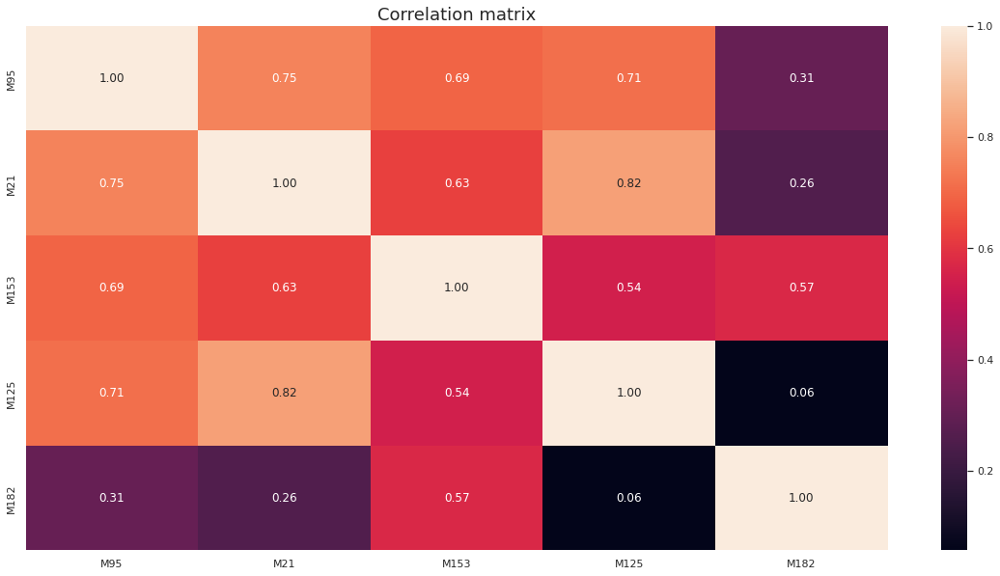

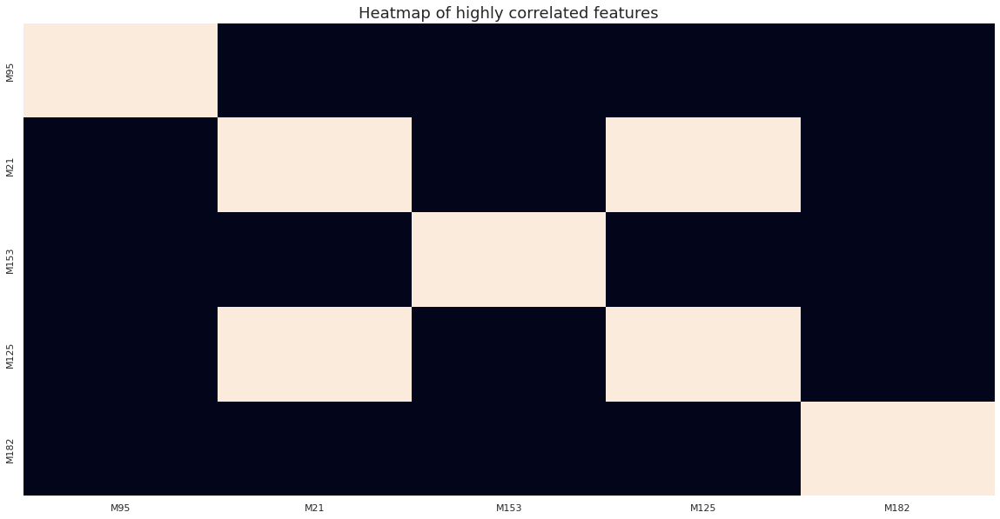



###################################################################################################################################################### 



In [43]:
matrix = pd.concat([target, X_remove_corr_imp_halfmin_std_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 1 feature

In [44]:
#target = 
matrix = X_remove_corr_imp_halfmin_std.copy()

X_remove_corr_imp_halfmin_std_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_halfmin_std_fs_nb_1)

Initial number of dimension : 169
Final number of dimension : 1


,features,f_scores,p_values
63,M95,37.851,0.0


,M95
0,2.004503
1,1.645691
2,0.322213
3,-1.183056
4,0.643112
...,...
90,0.601245
91,-1.074731
92,-0.722515
93,-1.947382


#### For further analysis, we have the following reduced dataframes :
- <code>X_remove_corr_imp_halfmin_std_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_remove_corr_imp_halfmin_std_fs_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>X_remove_corr_imp_halfmin_std_fs_nb_N</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [45]:
from classification_functions import *

In [46]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import LeaveOneOut

## a - Launch pipeline with differently preprocessed dataframes

In [47]:
# target =

### with <code>X_remove_corr_imp_halfmin_std_PCA</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,1,0,5,4
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,0.50,1.00,0.67,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,0.50,0.67,10.00
QC,0.43,1.00,0.60,3.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.73,0.88,0.73,19.00
weighted avg,0.88,0.74,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



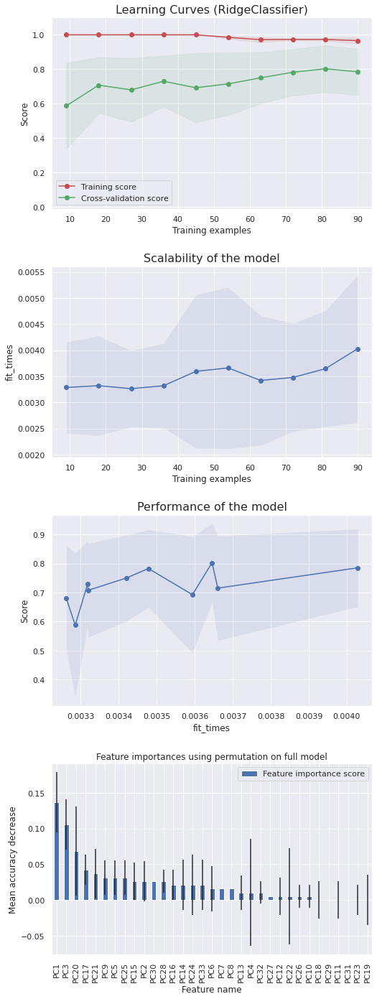




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.90,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.96,0.97,0.96,19.00
weighted avg,0.96,0.95,0.95,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocess

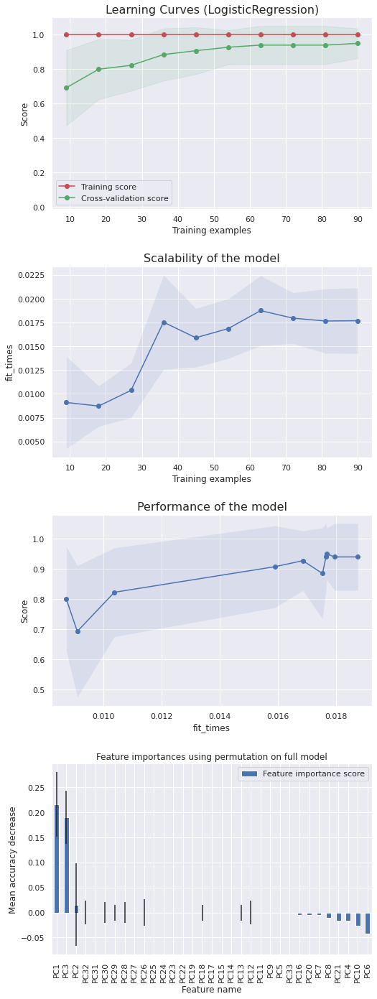




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,1,0,6,3
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,0.50,1.00,0.67,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,0.60,0.75,10.00
QC,0.50,1.00,0.67,3.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.75,0.90,0.77,19.00
weighted avg,0.89,0.79,0.80,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



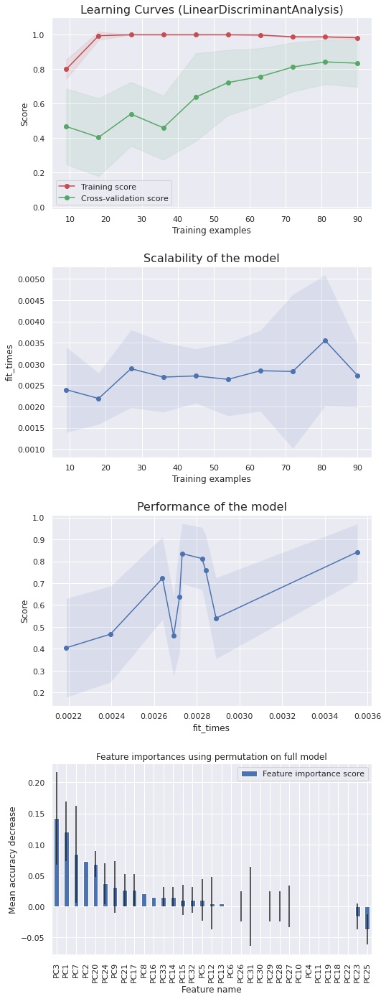




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



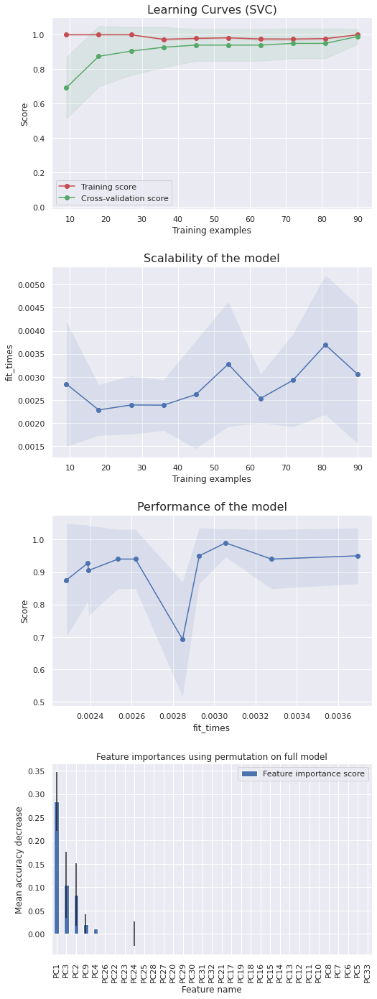




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,1,1,7,1
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,0.50,1.00,0.67,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.70,0.82,10.00
QC,0.75,1.00,0.86,3.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.77,0.93,0.81,19.00
weighted avg,0.89,0.84,0.84,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



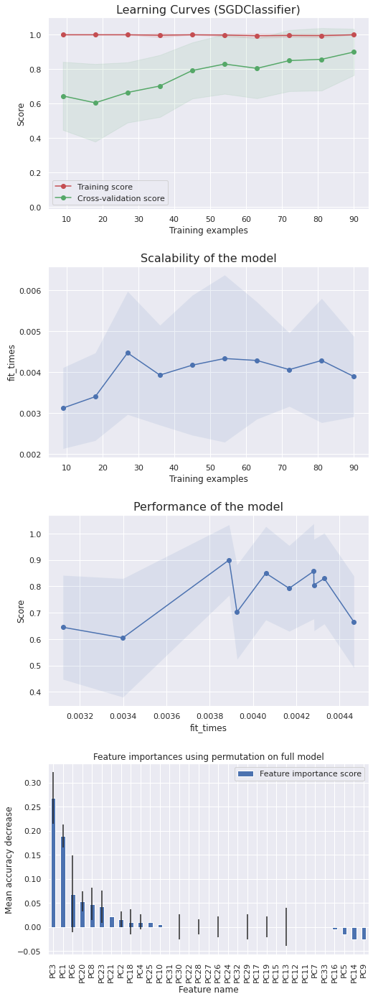




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,5,4
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.50,0.67,10.00
QC,0.43,1.00,0.60,3.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.82,0.88,0.79,19.00
weighted avg,0.87,0.74,0.74,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



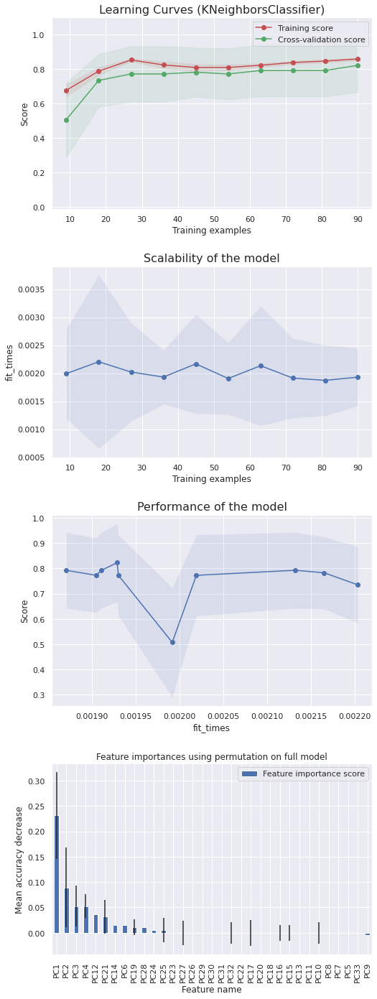




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,2,5,3
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.71,1.00,0.83,5.00
Patient,1.00,0.50,0.67,10.00
QC,0.50,1.00,0.67,3.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.80,0.88,0.79,19.00
weighted avg,0.85,0.74,0.73,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



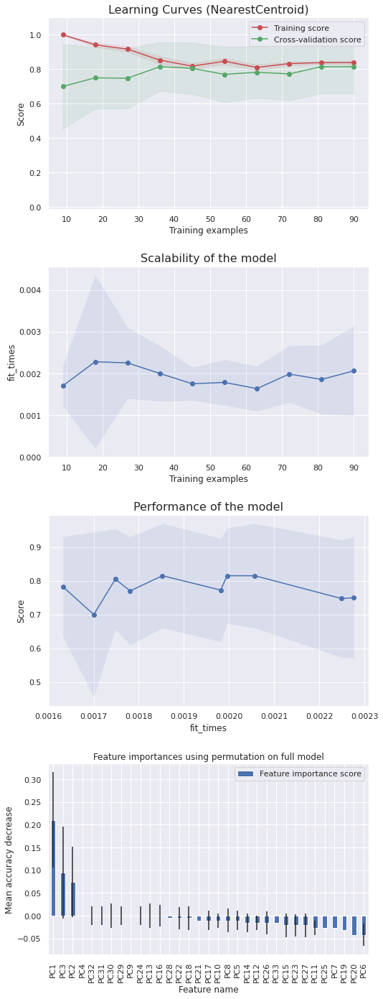




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,1,0,0
Control,0,5,0,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,0.71,1.00,0.83,5.00
Patient,1.00,0.90,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.68,0.72,0.70,19.00
weighted avg,0.87,0.89,0.88,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000

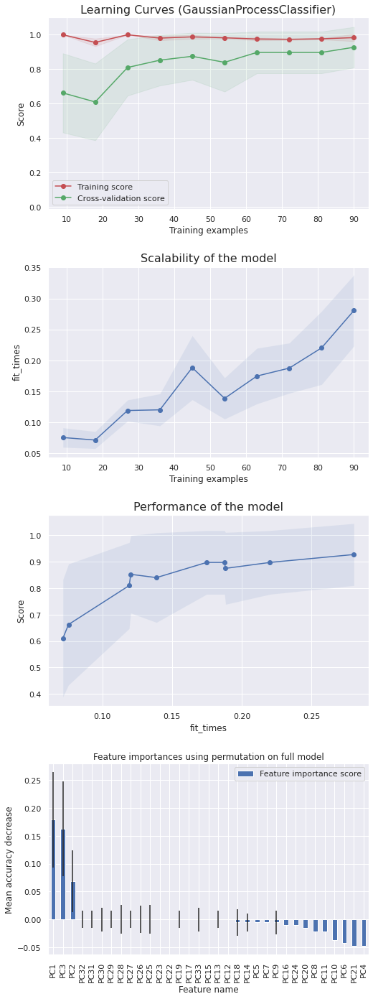




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,0,1,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,0.91,1.00,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.73,0.75,0.74,19.00
weighted avg,0.90,0.95,0.92,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



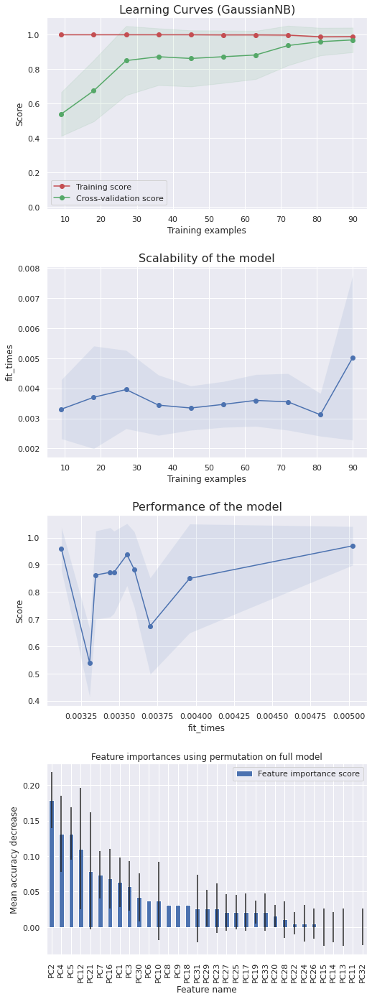




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



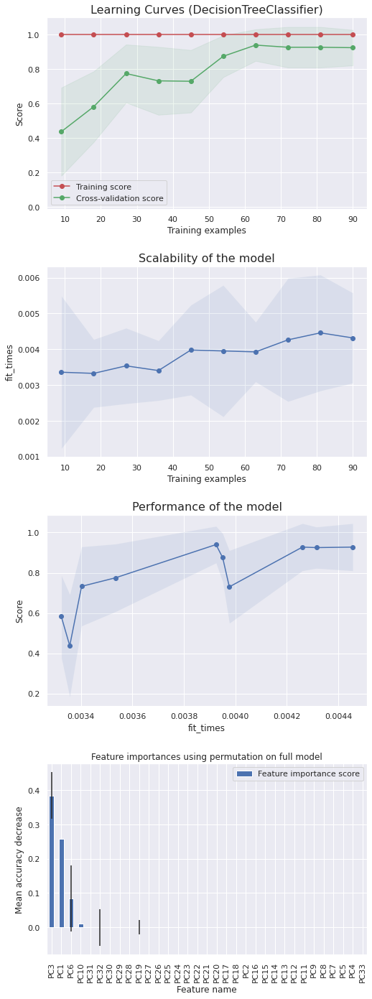




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



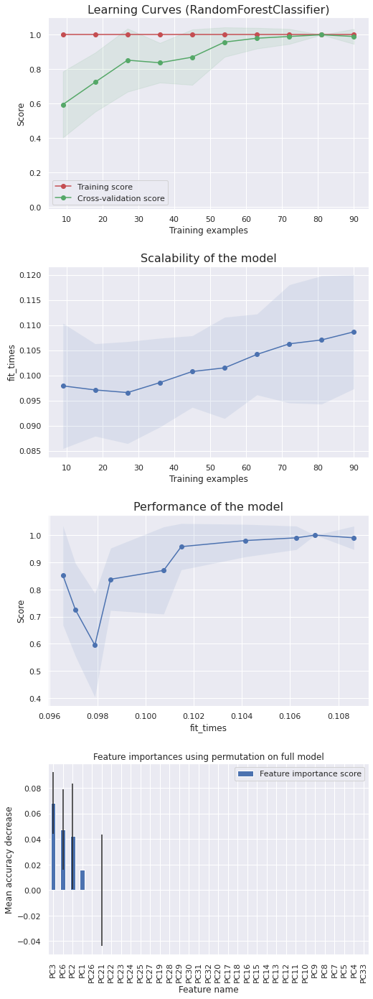




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



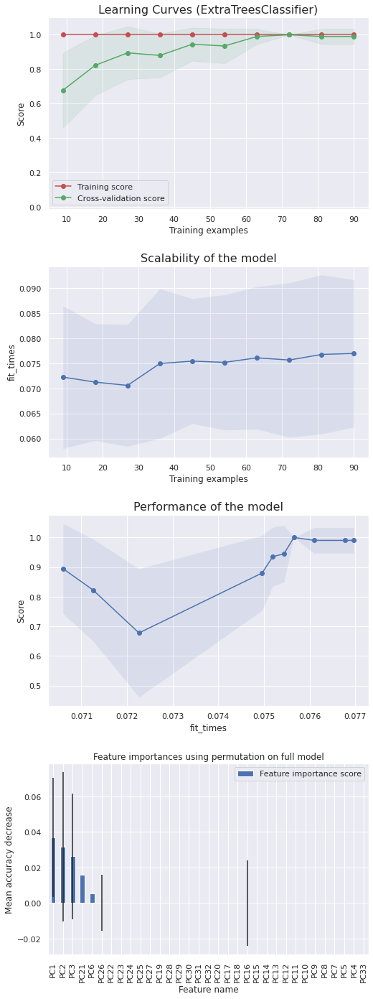




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.90,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.96,0.97,0.96,19.00
weighted avg,0.96,0.95,0.95,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



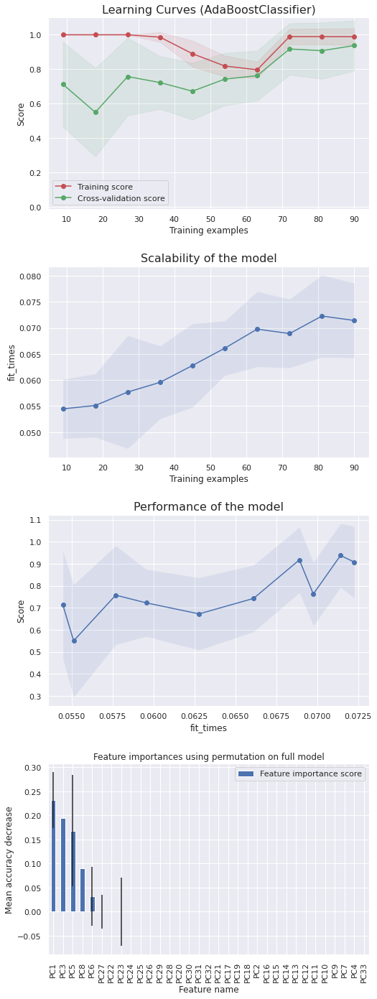




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



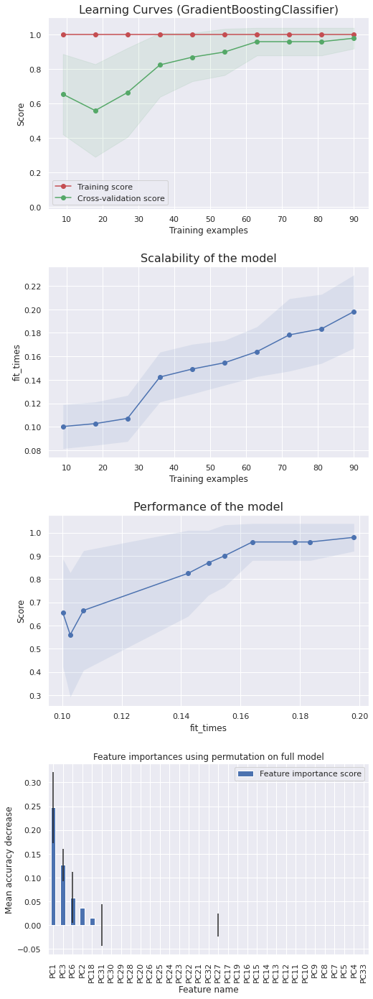




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



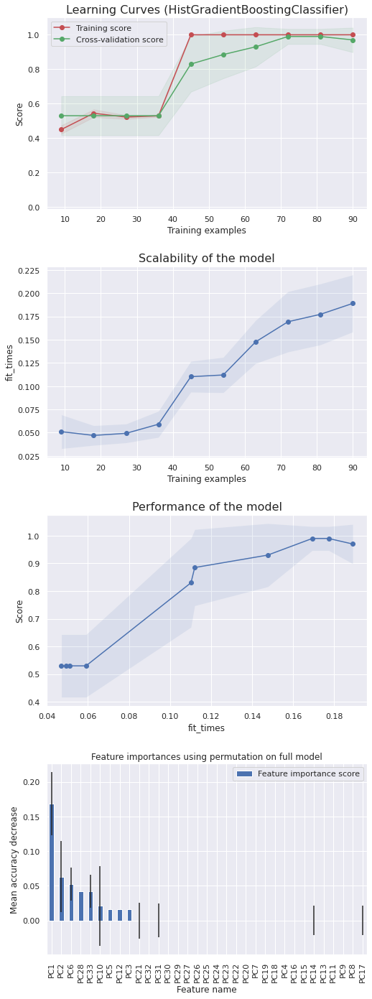




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,1,0,0
Control,0,5,0,0
Patient,0,5,5,0
QC,0,0,0,3



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,0.45,1.00,0.62,5.00
Patient,1.00,0.50,0.67,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.68,0.68,0.68,0.68
macro avg,0.61,0.62,0.57,19.00
weighted avg,0.80,0.68,0.67,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-

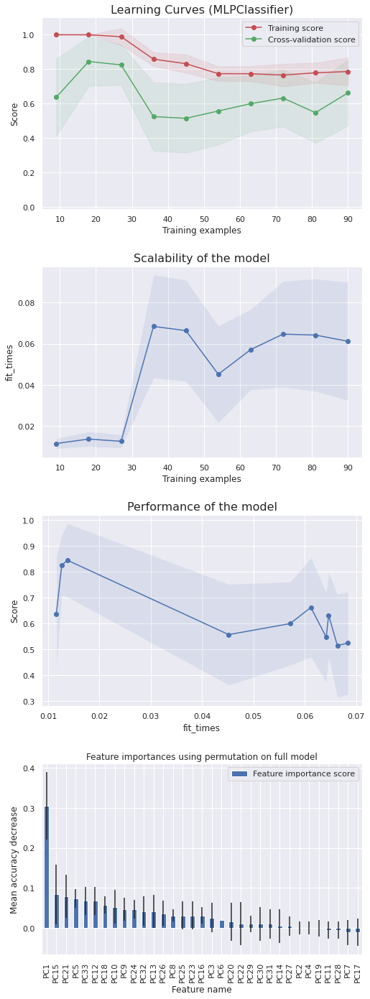




###################################################################################################################################################### 



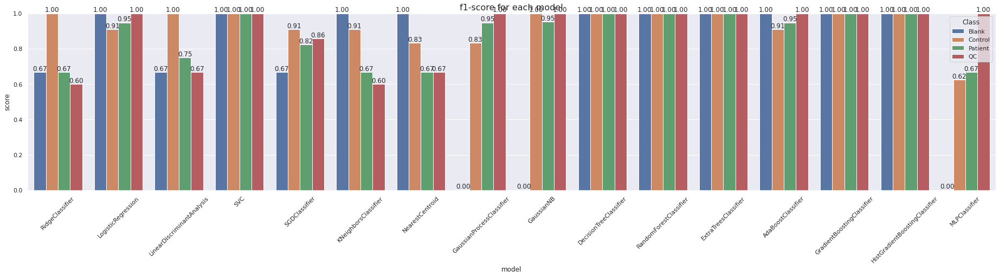


 ######################################################################################################################################################

Time to compute : 00h01m20s

 ######################################################################################################################################################






In [48]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_halfmin_std_PCA, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, 
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [49]:
print()

### with <code>X_remove_corr_imp_halfmin_std_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,0,1,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,0.91,1.00,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.73,0.75,0.74,19.00
weighted avg,0.90,0.95,0.92,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



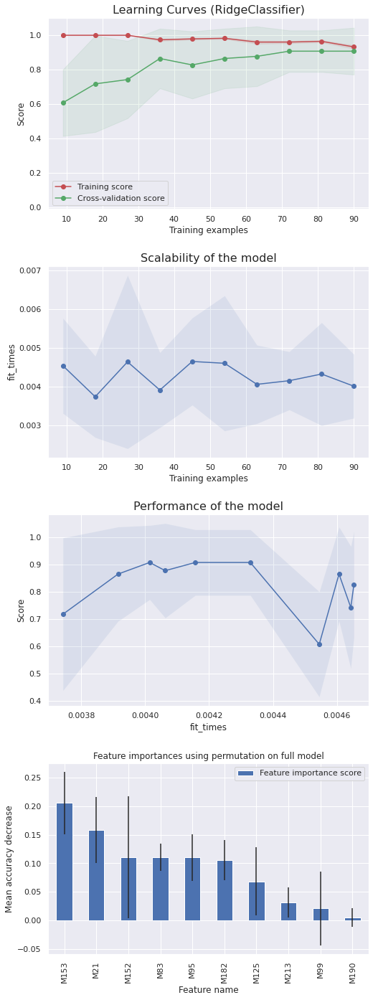




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.90,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.96,0.97,0.96,19.00
weighted avg,0.96,0.95,0.95,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



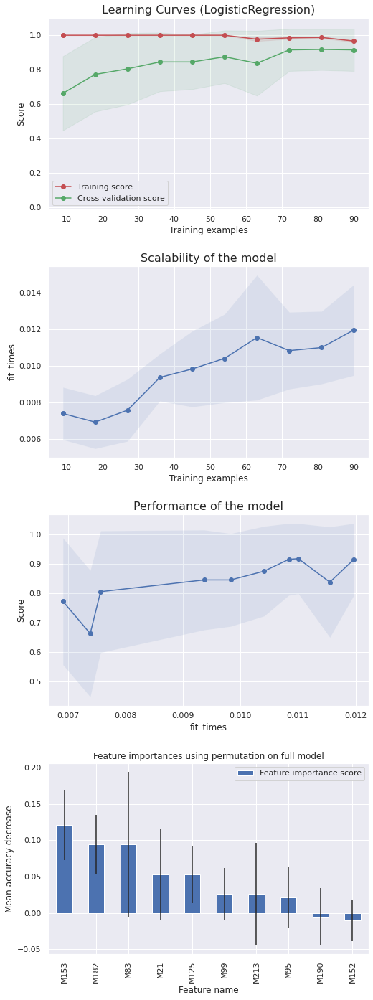




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,9,1
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,0.90,0.95,10.00
QC,0.75,1.00,0.86,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.94,0.97,0.95,19.00
weighted avg,0.96,0.95,0.95,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



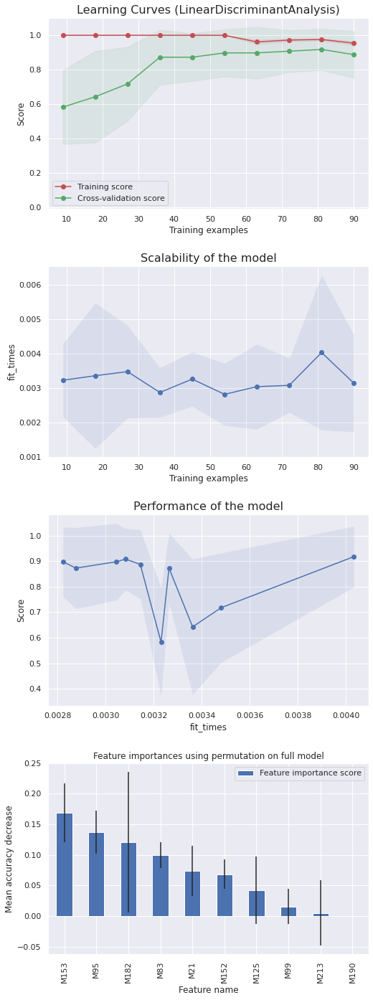




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



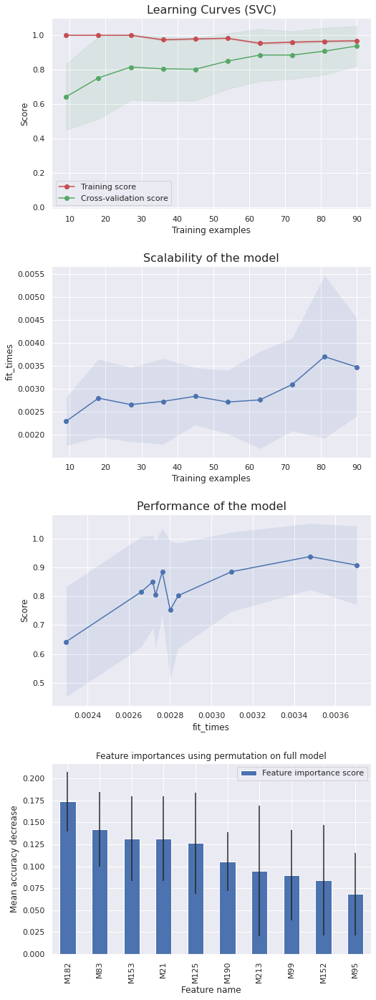




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.90,0.95,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.95,0.95,0.95,0.95
macro avg,0.96,0.97,0.96,19.00
weighted avg,0.96,0.95,0.95,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



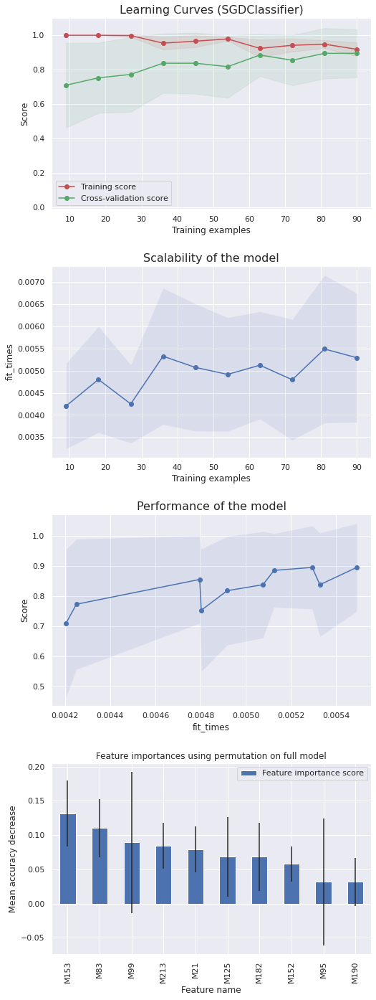




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,7,3
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,0.70,0.82,10.00
QC,0.50,1.00,0.67,3.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.88,0.93,0.87,19.00
weighted avg,0.92,0.84,0.85,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



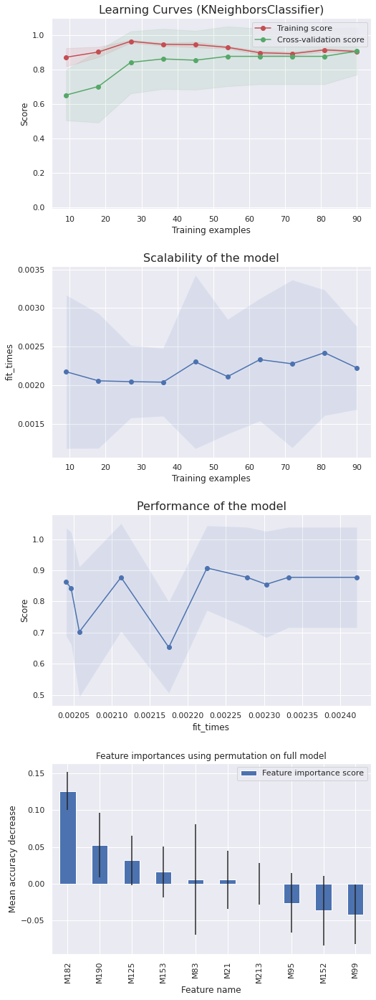




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,1,0,6,3
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,0.50,1.00,0.67,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,0.60,0.75,10.00
QC,0.50,1.00,0.67,3.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.75,0.90,0.77,19.00
weighted avg,0.89,0.79,0.80,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



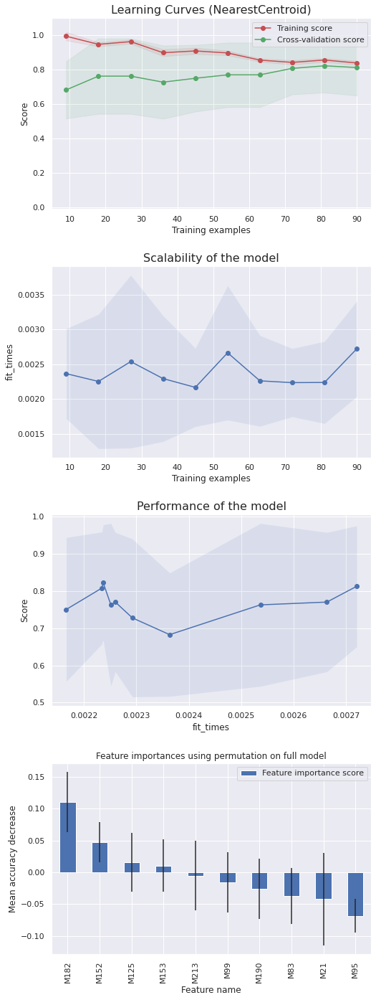




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,0,0,1
Control,0,5,0,0
Patient,0,1,8,1
QC,0,0,0,3



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.80,0.89,10.00
QC,0.60,1.00,0.75,3.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.61,0.70,0.64,19.00
weighted avg,0.84,0.84,0.83,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000

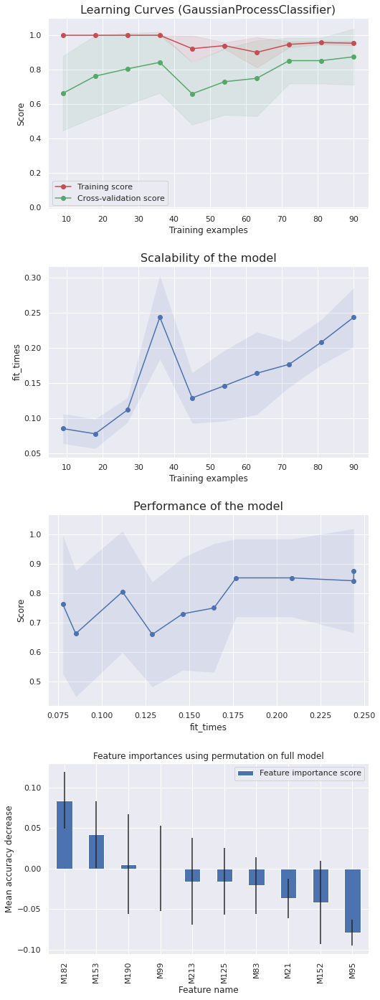




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



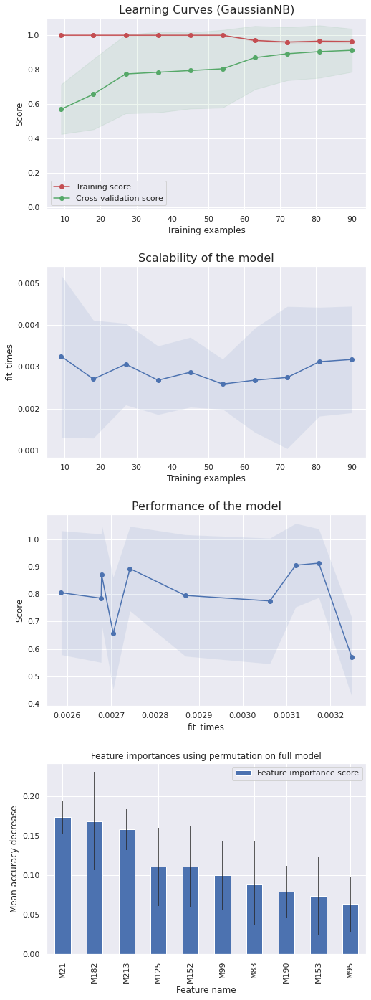




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,4,0,1
Patient,0,1,8,1
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.80,0.80,0.80,5.00
Patient,1.00,0.80,0.89,10.00
QC,0.60,1.00,0.75,3.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.85,0.90,0.86,19.00
weighted avg,0.88,0.84,0.85,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



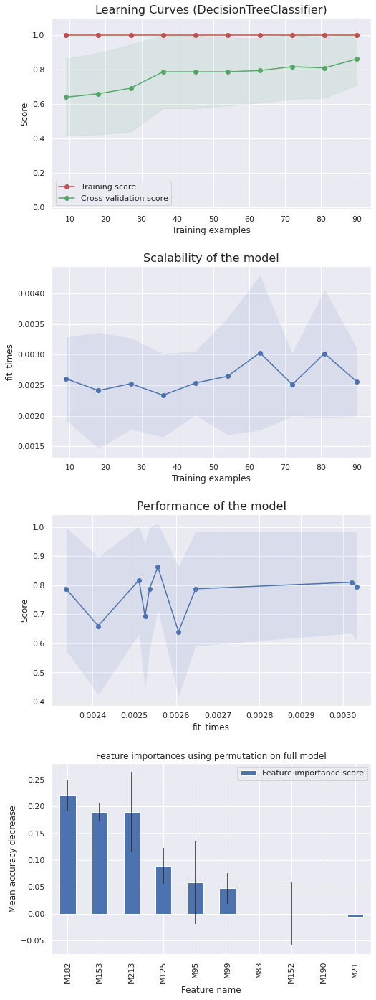




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,0,10,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,1.00,1.00,1.00,5.00
Patient,1.00,1.00,1.00,10.00
QC,1.00,1.00,1.00,3.00
accuracy,1.00,1.00,1.00,1.00
macro avg,1.00,1.00,1.00,19.00
weighted avg,1.00,1.00,1.00,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



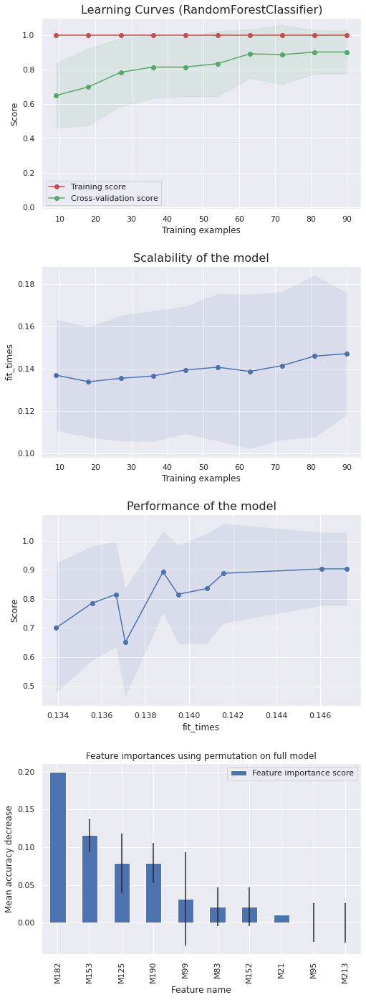




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,5,0,0
Patient,0,1,8,1
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.83,1.00,0.91,5.00
Patient,1.00,0.80,0.89,10.00
QC,0.75,1.00,0.86,3.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.90,0.95,0.91,19.00
weighted avg,0.92,0.89,0.90,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



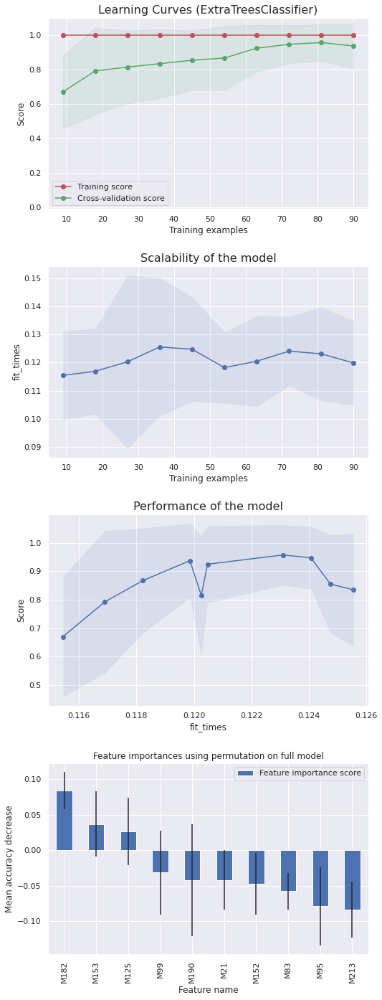




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,4,0,1
Patient,0,2,7,1
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.67,0.80,0.73,5.00
Patient,1.00,0.70,0.82,10.00
QC,0.60,1.00,0.75,3.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.82,0.88,0.83,19.00
weighted avg,0.85,0.79,0.80,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



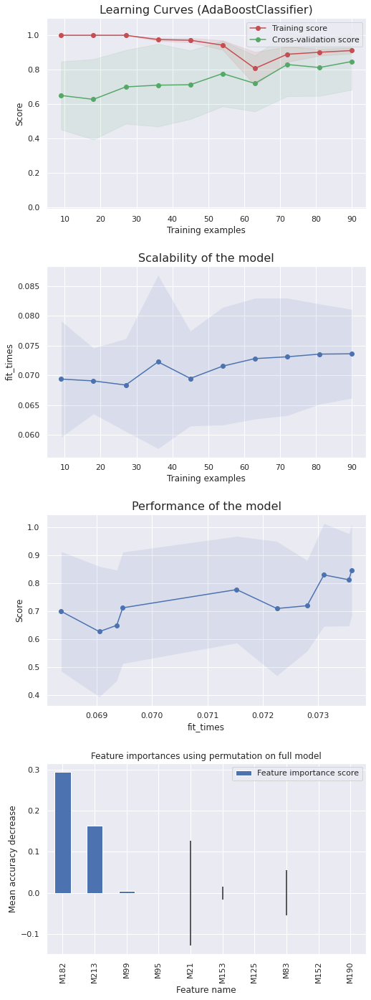




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,4,1,0
Patient,0,1,9,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.80,0.80,0.80,5.00
Patient,0.90,0.90,0.90,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.93,0.93,0.93,19.00
weighted avg,0.89,0.89,0.89,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



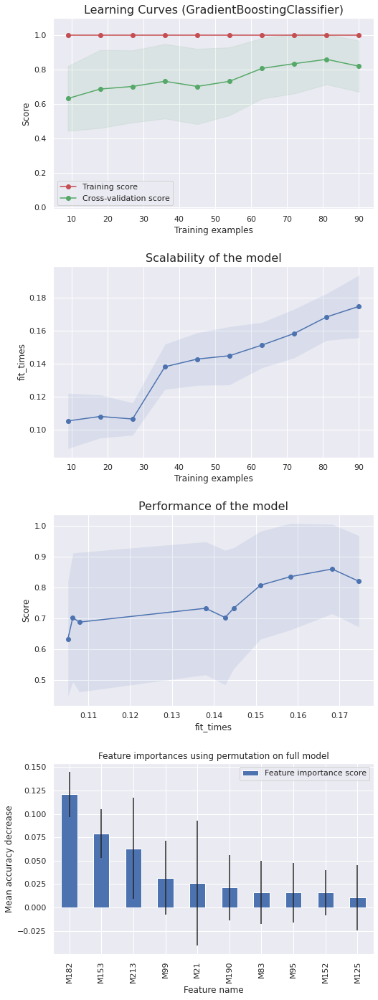




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,1,0,0,0
Control,0,3,2,0
Patient,0,2,8,0
QC,0,0,0,3



Classification report :


,precision,recall,f1-score,support
Blank,1.00,1.00,1.00,1.00
Control,0.60,0.60,0.60,5.00
Patient,0.80,0.80,0.80,10.00
QC,1.00,1.00,1.00,3.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.85,0.85,0.85,19.00
weighted avg,0.79,0.79,0.79,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.



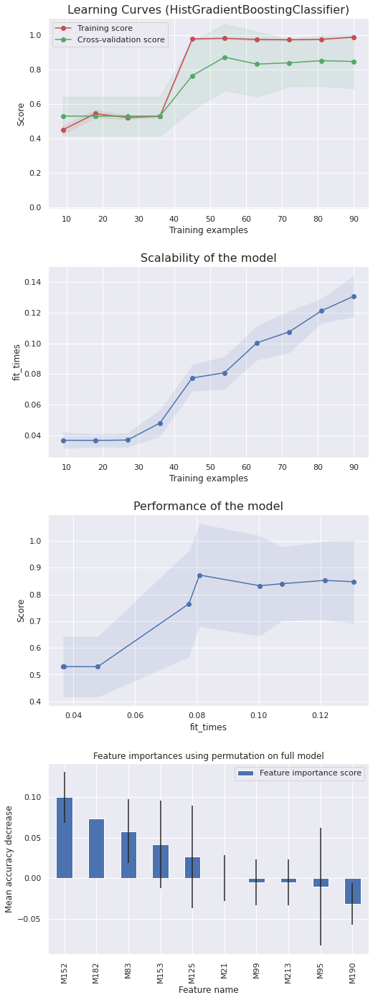




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'Blank': 0, 'Control': 1, 'Patient': 2, 'QC': 3}

Confusion matrix :


,Blank,Control,Patient,QC
true/pred,,,,
Blank,0,1,0,0
Control,0,5,0,0
Patient,0,2,8,0
QC,0,3,0,0



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
Blank,0.00,0.00,0.00,1.00
Control,0.45,1.00,0.62,5.00
Patient,1.00,0.80,0.89,10.00
QC,0.00,0.00,0.00,3.00
accuracy,0.68,0.68,0.68,0.68
macro avg,0.36,0.45,0.38,19.00
weighted avg,0.65,0.68,0.63,19.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=20.

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/

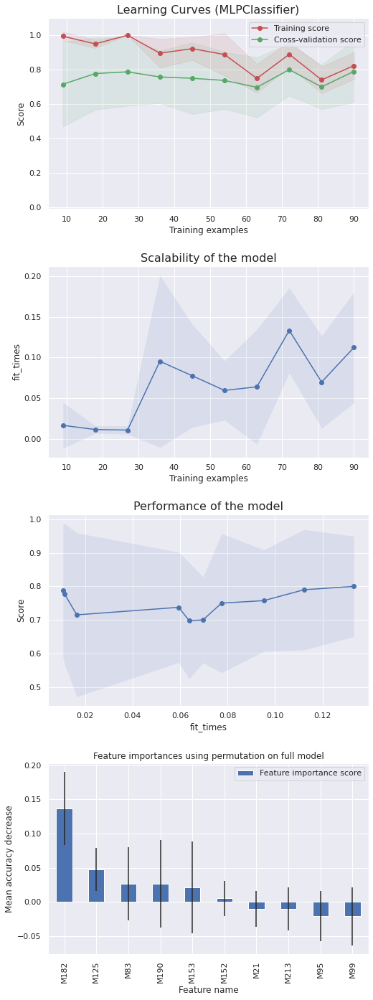




###################################################################################################################################################### 



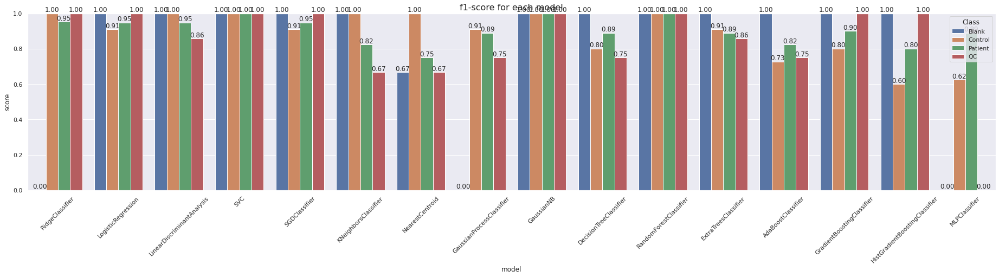


 ######################################################################################################################################################

Time to compute : 00h01m10s

 ######################################################################################################################################################






In [50]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_halfmin_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True, 
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [51]:
print()

### with <code>X_remove_corr_imp_halfmin_std_fs_nb_5</code>

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` p

###################################################################################################################################################### 



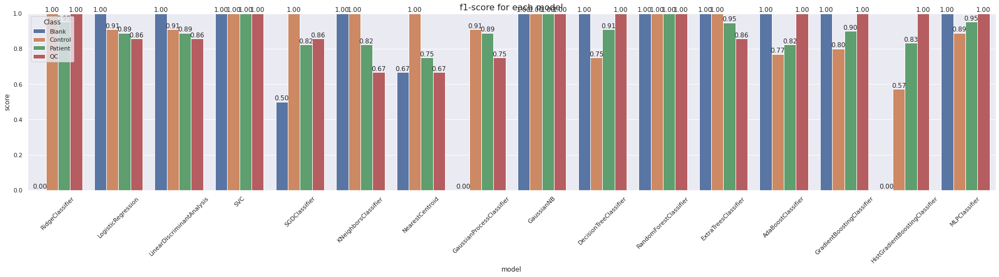


 ######################################################################################################################################################

Time to compute : 00h00m04s

 ######################################################################################################################################################






In [52]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_halfmin_std_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=False, plot_hist_score=True,
                                                                score='f1-score', cv=10, train_size=0.7, test_size=0.3)

In [53]:
print()

### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [54]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
Blank,0.00,1.00,1.00,1.00,0.50,1.00,0.67,0.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00
Control,1.00,0.91,0.91,1.00,1.00,1.00,1.00,0.91,1.00,0.75,1.00,1.00,0.77,0.80,0.57,0.89
Patient,0.95,0.89,0.89,1.00,0.82,0.82,0.75,0.89,1.00,0.91,1.00,0.95,0.82,0.90,0.83,0.95
QC,1.00,0.86,0.86,1.00,0.86,0.67,0.67,0.75,1.00,1.00,1.00,0.86,1.00,1.00,1.00,1.00


In [55]:
dict_df_feature_importance['DecisionTreeClassifier']

,Feature name,Feature importance score
4,M182,0.20
1,M21,0.18
2,M153,0.11
0,M95,0.11
3,M125,0.00


In [56]:
print()

# 7 - Clustering

In [57]:
from clustering_functions import *

In [58]:
#target = 

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



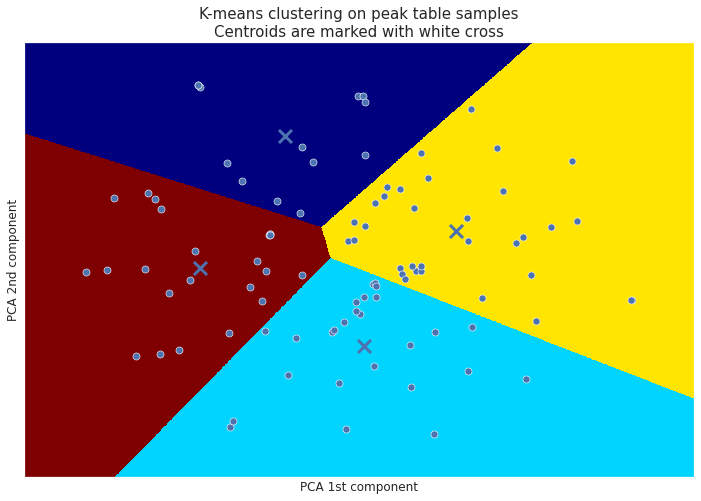

Inertia of k-means model : 239.68


In [59]:
kmeans = perform_kmeans(X_remove_corr_imp_halfmin_std_PCA_tSNE.astype('double'), n_clusters=4, col_prefix='PCA')

## b - Affinity propagation

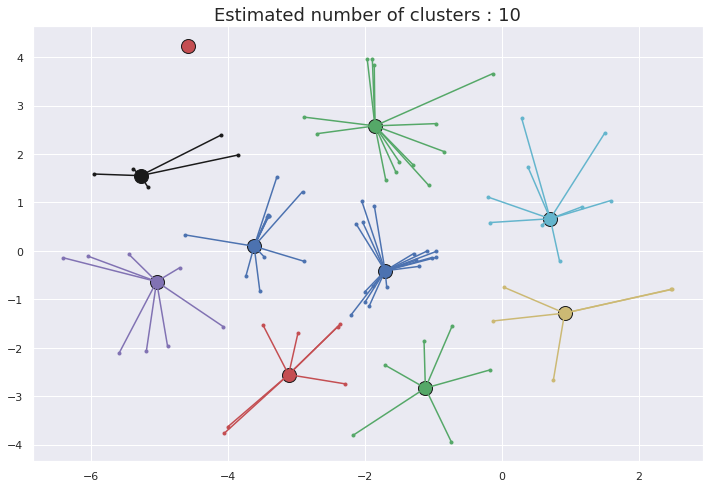

In [64]:
af = perform_affinity_propagation(X_remove_corr_imp_halfmin_std_PCA_tSNE)

## c - Hierarchical clustering

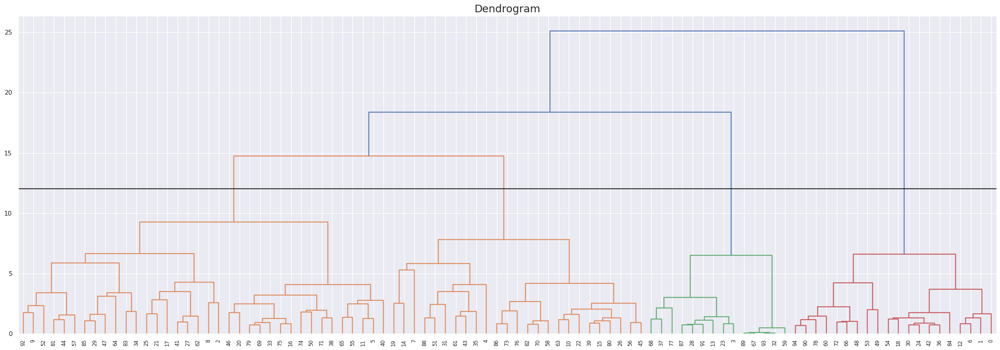

In [65]:
plot_dendrogram(X_remove_corr_imp_halfmin_std_fs_nb_10, hline=12)

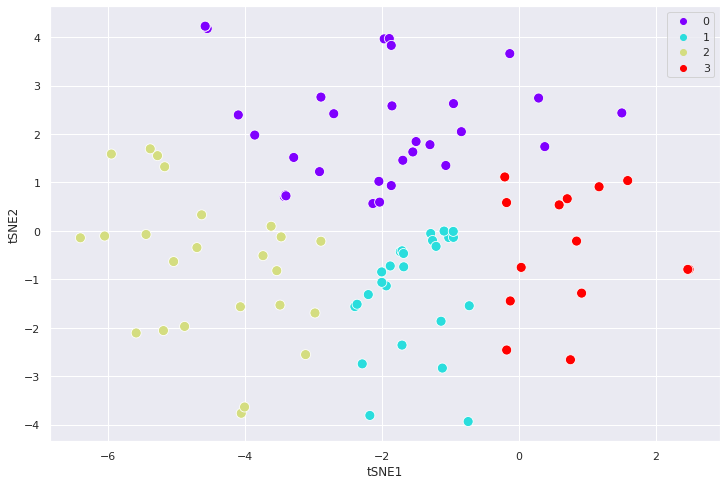

In [66]:
hc = perform_hierarchical_clustering(X_remove_corr_imp_halfmin_std_PCA_tSNE, n_clusters=4)

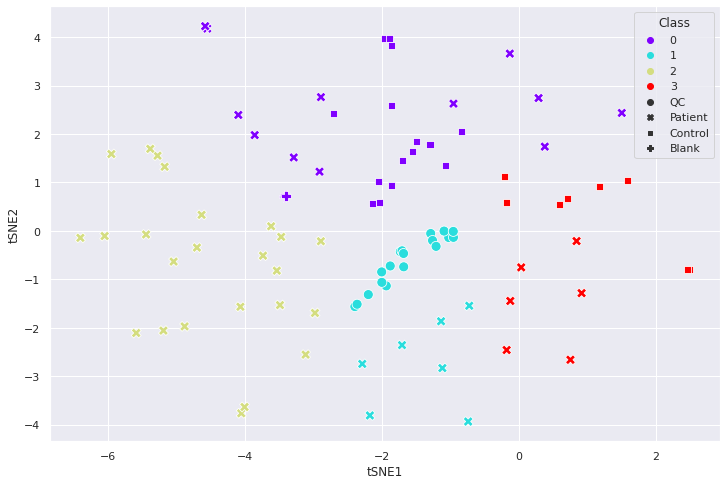

In [67]:
hc = perform_hierarchical_clustering(X_remove_corr_imp_halfmin_std_PCA_tSNE, n_clusters=4, target=target)